# Data Dive: US Colleges

Objective: Predict graduation rate of US colleges using classification and regression techniques. 

### Group 2: Molly Scally, Ruth Dohrmann, Joshua Wheaton

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import gridspec
import matplotlib.pyplot as plt
# plt.style.use('fivethirtyeight')
%matplotlib inline

from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error,mean_absolute_percentage_error

from numpy import arange
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score


from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.model_selection import train_test_split # to split data into training and testing sets
from sklearn.model_selection import cross_val_score # for cross validation
from sklearn.metrics import confusion_matrix, classification_report # to create a confusion matrix and classification report
from sklearn.metrics import ConfusionMatrixDisplay # to draw a confusion matrix
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.metrics import precision_score, recall_score # to calculate the performance metrics
from sklearn.metrics import roc_curve, roc_auc_score # to calculate the performance metrics
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss # to calculate the performance metrics


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Import the data 

df = pd.read_csv('college_data.csv')
df.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


### Exploratory Data Analysis:

In [3]:
# Get basic informational of the columns, data types

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Private      777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

There are 18 variables, and all are numeric except for Private, which is an object.   
There are 777 values and none are missing.  

In [4]:
# Get basic statistical summary of the data

df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


Numerical variables are as follows:   

- Apps: Number of applications received  
- Accept: Number of applications accepted  
- Enroll: Number of new students enrolled  
- Top10perc: Pct. new students from top 10% of H.S. class   
- Top25perc: Pct. new students from top 25% of H.S. class  
- F_Undergrad: Number of full-time undergraduates  
- P_Undergrad: Number of part-time undergraduates     
- Outstate: Out-of-state tuition      
- Room.Board: Room and board costs     
- Books: Estimated book costs     
- Personal: Estimated personal spending      
- PhD: Pct. of faculty with Ph.D.’s     
- Terminal: Pct. of faculty with terminal degree     
- S_F_Ratio: Student/faculty ratio   
- perc_alumni: Pct. alumni who donate    
- Expend: Instructional expenditure per student    
- Grad_Rate: Graduation rate (***target***) 

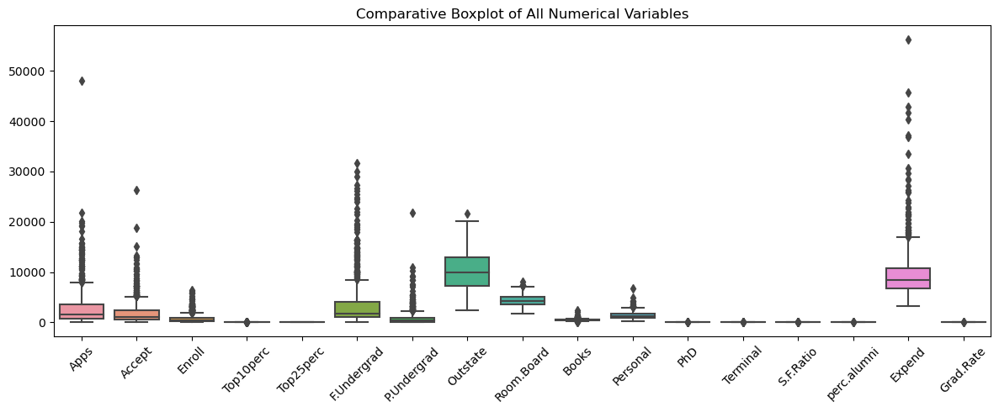

In [5]:
# comparitive boxplot of numerical variables

# create filtered df of only numerical data
num_cols_df = df.select_dtypes(include=['int64', 'float64'])

# figure and plot
plt.figure(figsize=(12, 5))
sns.boxplot(data=num_cols_df)
plt.title('Comparative Boxplot of All Numerical Variables')
plt.xticks(rotation=45) # rotate x-labels for readability
plt.tight_layout()
plt.show()

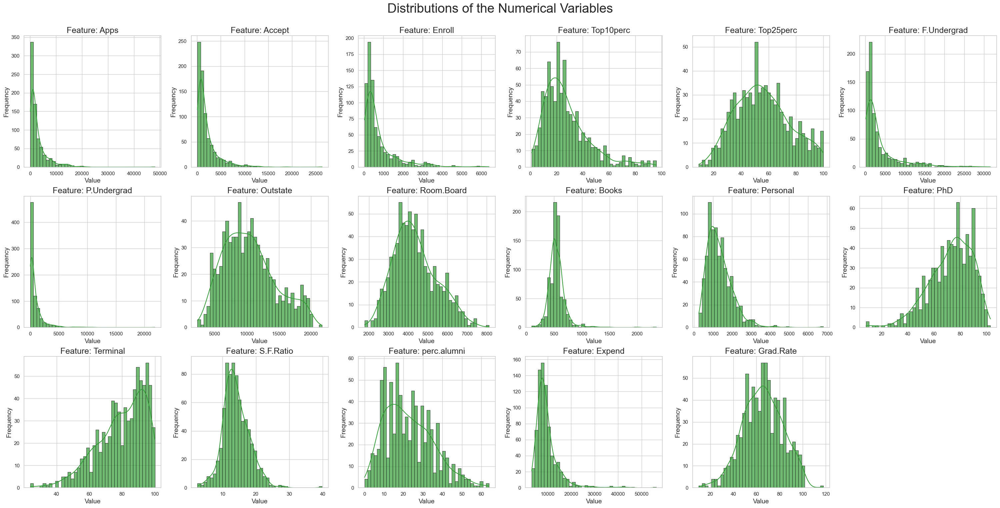

In [6]:
# Produce histograms for all numerical variables

from matplotlib import gridspec

sns.set_theme(style='whitegrid', palette='pastel')

def plot_numerical_distributions(df_copy):
    # Get only the numerical columns 
    num_cols = df_copy.select_dtypes(include=['int64', 'float64']).columns
    num_features = len(num_cols)

    # Layout calculation
    ncols = 6  # Number of columns per row 
    nrows = (num_features + ncols - 1) // ncols  # Rows needed for the columns

    # Setup figure and gridspec
    fig = plt.figure(figsize=(5 * ncols, 5 * nrows))  
    gs = gridspec.GridSpec(nrows, ncols)

    def plot_hist(data, column, ax):
        sns.histplot(data=data, x=column, ax=ax, kde=True, bins=40, alpha=0.7, edgecolor='black', color='#349C36')
        ax.set_title(f'Feature: {column}', fontsize=18)
        ax.set_xlabel('Value', fontsize=14)
        ax.set_ylabel('Frequency', fontsize=14)

    for i, col in enumerate(num_cols):
        ax = fig.add_subplot(gs[i // ncols, i % ncols])
        plot_hist(df_copy, col, ax)

    plt.suptitle("Distributions of the Numerical Variables", fontsize=28, y=1.01)
    plt.tight_layout(pad=0.6)
    plt.show()

plot_numerical_distributions(df)

Create dummy variables for 'Private'

In [7]:
dummies = pd.get_dummies(df['Private'], prefix="Private").astype(int)
df = pd.concat([df, dummies], axis=1)
df.drop(columns=['Private'], axis=1, inplace=True)
df.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0,1
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0,1
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0,1
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,0,1
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0,1


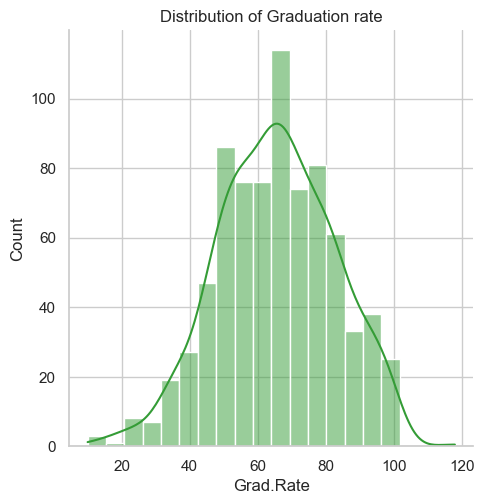

In [8]:
#Quick distribution plot
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['Grad.Rate'], color='#349C36', kde=True)
plt.title('Distribution of Graduation rate')
plt.show()

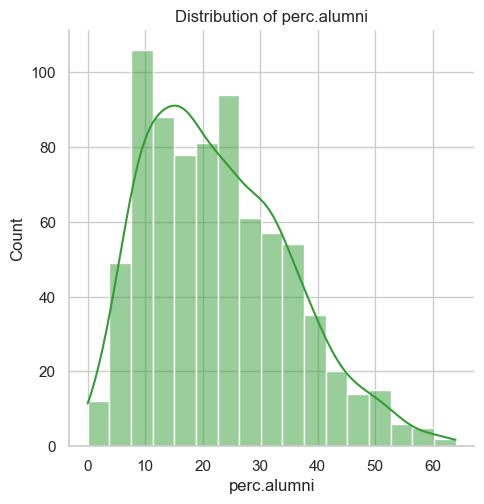

In [9]:
#Quick distribution plot
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['perc.alumni'], color='#349C36', kde=True)
plt.title('Distribution of perc.alumni')
plt.show()

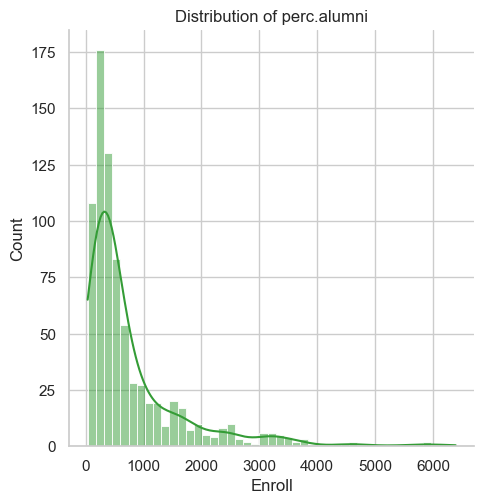

In [10]:
#Quick distribution plot 
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['Enroll'], color='#349C36', kde=True)
plt.title('Distribution of perc.alumni')
plt.show()

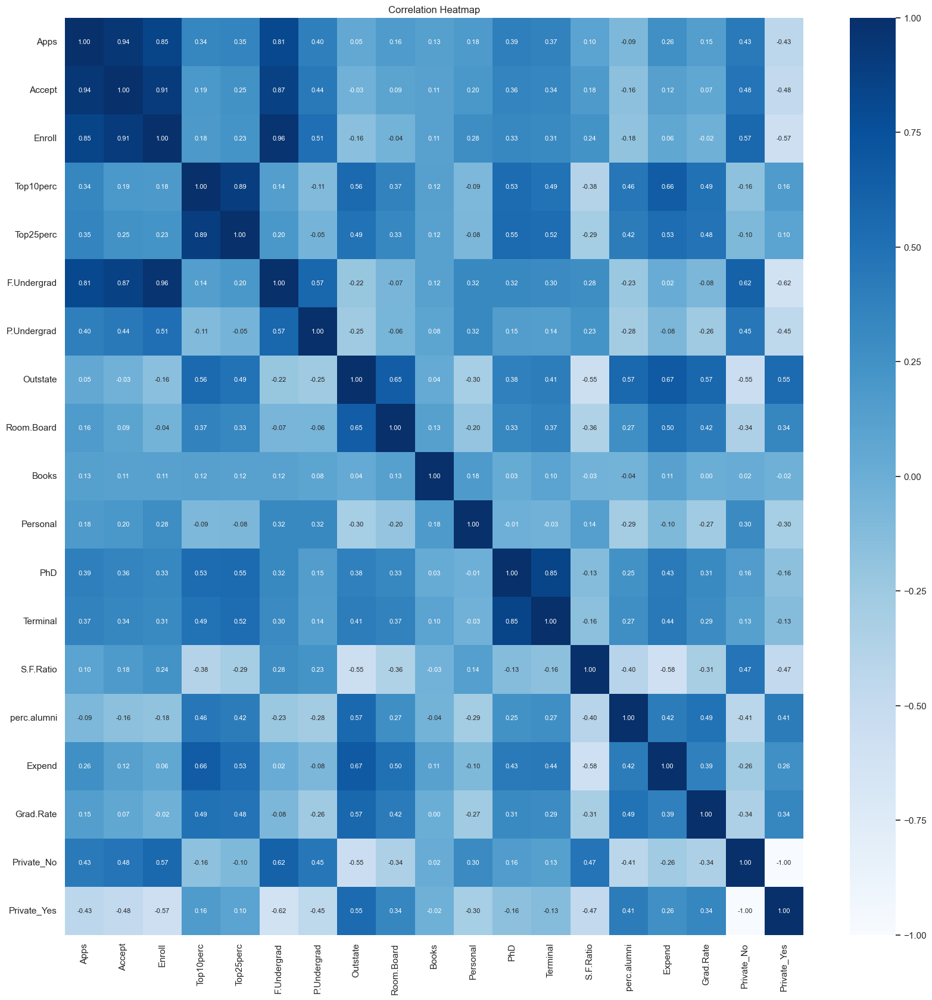

In [11]:
#Correlation Heatmap
f, ax = plt.subplots(figsize=(20, 20))
corr = df.corr()
sns.heatmap(corr, annot=True, fmt='.2f', annot_kws={'fontsize': 8}, cmap='Blues')
plt.title('Correlation Heatmap', fontsize=12)
plt.show()

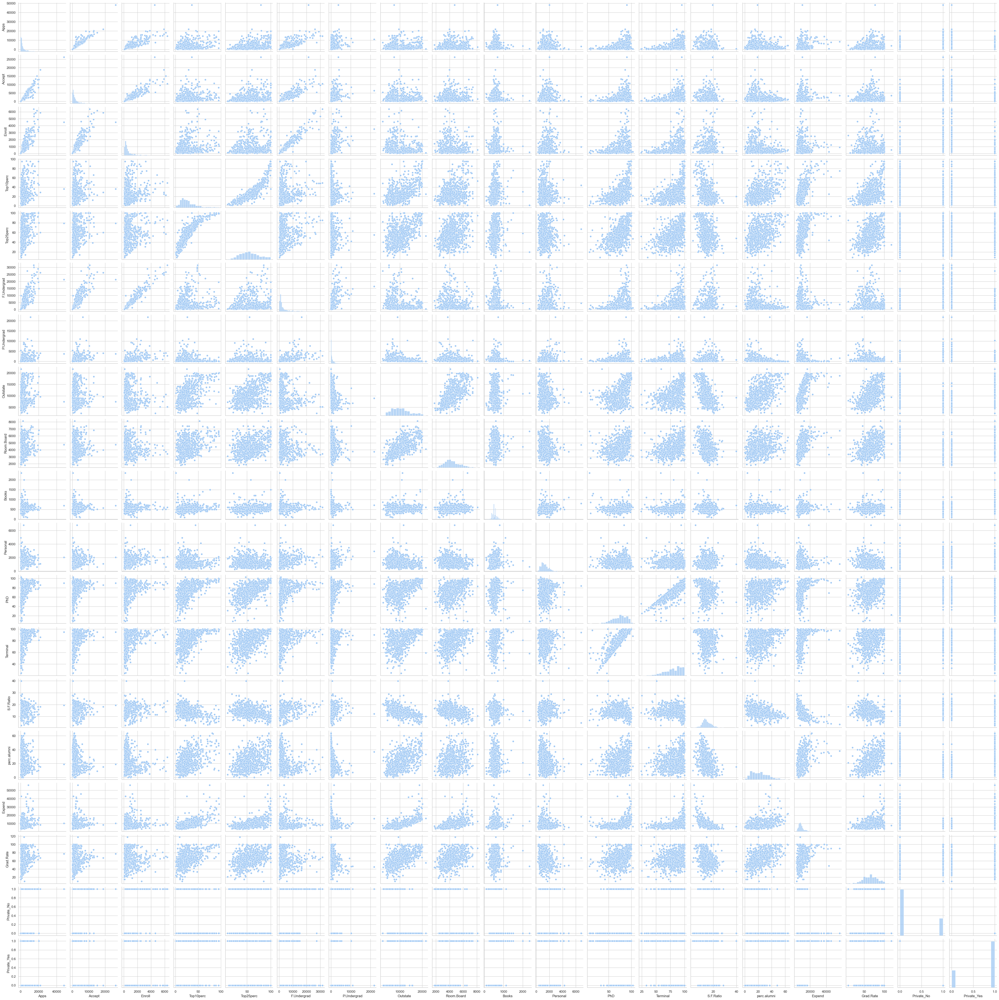

In [12]:
sns.pairplot(df)
plt.show()

In [13]:
pairwiseCorr = df.select_dtypes(include=np.number).corr()
# Print pairs that have a correlation of more than 0.8 in absolute value
reordered = pairwiseCorr.abs().unstack()
reordered = reordered.sort_values(ascending=True)
columns_final = [(col1, col2) for col1, col2 in reordered.index if (reordered.loc[col1].at[col2] > 0.8) and col1 != col2]
print("Pairs that have a correlation of more than 0.8 in absolute value: ")
for x in columns_final:
    print(x[0], x[1])

Pairs that have a correlation of more than 0.8 in absolute value: 
Apps F.Undergrad
F.Undergrad Apps
Apps Enroll
Enroll Apps
Terminal PhD
PhD Terminal
Accept F.Undergrad
F.Undergrad Accept
Top25perc Top10perc
Top10perc Top25perc
Accept Enroll
Enroll Accept
Accept Apps
Apps Accept
F.Undergrad Enroll
Enroll F.Undergrad
Private_No Private_Yes
Private_Yes Private_No


In [14]:
# Generating a list of all the variables with a correlation score over 0.3 (absolute)
corr = df.corr()
high_pos_corr_vars = corr['Grad.Rate'].loc[corr['Grad.Rate'] >= 0.3].index.to_list()
print(high_pos_corr_vars)
high_neg_corr_vars = corr['Grad.Rate'].loc[corr['Grad.Rate'] <= -0.3].index.to_list()
print(high_neg_corr_vars)

['Top10perc', 'Top25perc', 'Outstate', 'Room.Board', 'PhD', 'perc.alumni', 'Expend', 'Grad.Rate', 'Private_Yes']
['S.F.Ratio', 'Private_No']


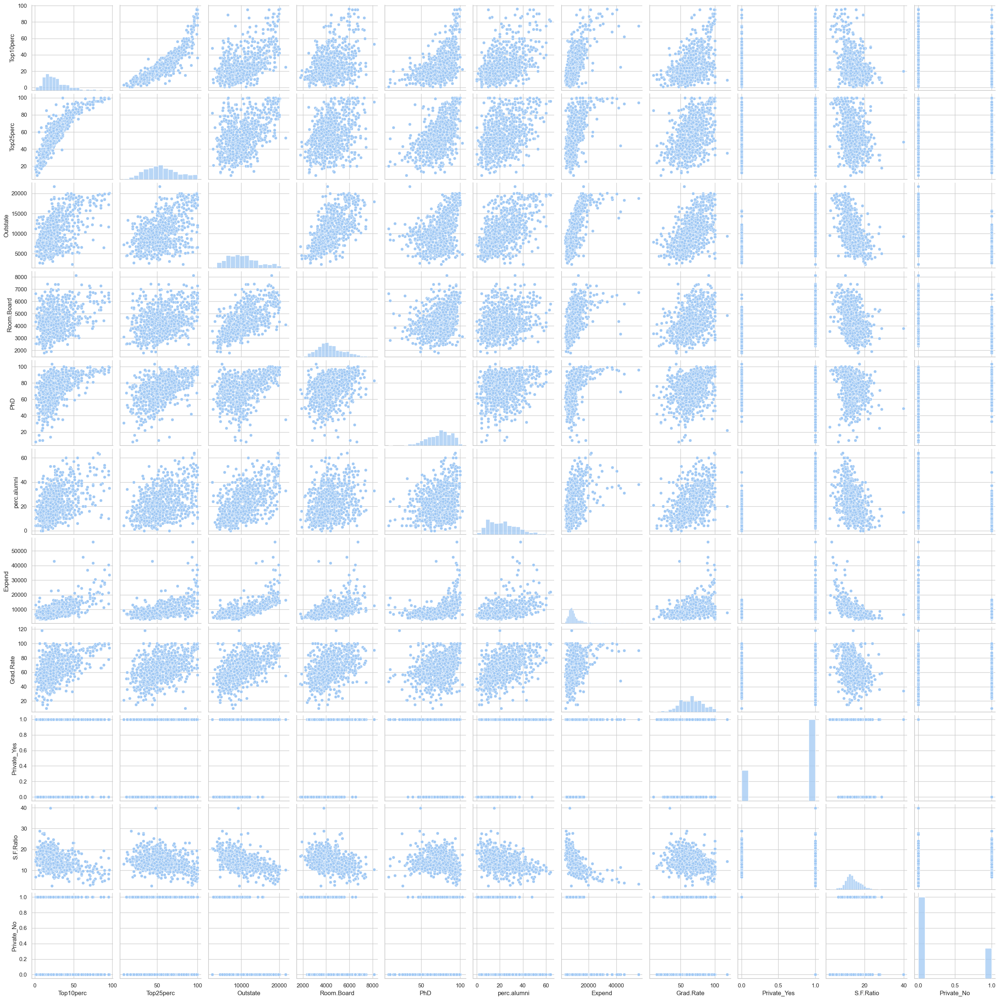

In [15]:
#pair plots for variables with high correlation
sns.set_theme(style='whitegrid', palette='pastel')
sns.pairplot(df[(high_pos_corr_vars + high_neg_corr_vars)])
plt.show()

### Make Grad.Rate categorical:

The target variable is Grad.Rate. We will use the rest of the variables to predict whether a college's graduation rate is above mean or below mean.  

First, we need to save the original, continuous graduation rate for each college in a separate variable. Once we encode its classes, it will be dropped for the classification tasks. Later, we'll need this variable to prepare the data for the regression task.    

In [16]:
# Store original Grad.Rate column for later use in regression models

savedGradRate = df["Grad.Rate"]

The Grad.Rate column will now be transformed, categorizing each value as:   

0 = Below mean graduation rate   
1 = Above mean graduation rate    

In [17]:
# Get the mean grad rate and categorize graduation rates as either above or below this value

print("Mean grad rate:", df["Grad.Rate"].mean().round(6))  # Split data at this value (the mean)

# Split Grad.Rate
df['Grad.Rate'] = np.where( df["Grad.Rate"] > df["Grad.Rate"].mean(), 1, 0)  # 0=below mean, 1=above mean
print("\nFirst few rows of transformed Grad.Rate column:")
print(df["Grad.Rate"].head().to_string())

# Produce the count of both levels of Grad.Rate
print("\nCount of each class of Grad.Rate:")
print(f"Class 0 (Below-average): {df['Grad.Rate'].value_counts()[0]} (or {(df['Grad.Rate'].value_counts(normalize=True)[0]*100).round(3)}%)")
print(f"Class 1 (Above-average): {df['Grad.Rate'].value_counts()[1]} (or {(df['Grad.Rate'].value_counts(normalize=True)[1]*100).round(3)}%)")


Mean grad rate: 65.46332

First few rows of transformed Grad.Rate column:
0    0
1    0
2    0
3    0
4    0

Count of each class of Grad.Rate:
Class 0 (Below-average): 391 (or 50.322%)
Class 1 (Above-average): 386 (or 49.678%)


The mean graduation rate is ~0.4968.   

The classes appear to be fairly balanced, at almost 50-50.  

Below mean graduation rate (Grad.Rate = 0):


,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
count,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.000000,391.0,391.000000,391.000000
mean,2548.421995,1826.017903,783.393862,20.468031,48.132992,4043.815857,1158.826087,8328.381074,3944.943734,553.795396,1506.109974,67.887468,75.401535,15.190026,17.263427,7962.588235,0.0,0.414322,0.585678
std,2974.150383,2015.229017,882.678632,11.248858,17.182511,5043.744395,1930.163230,2945.090075,935.203977,167.071101,699.889468,16.634614,15.187542,4.086805,9.921728,3196.070362,0.0,0.493236,0.493236
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,2.000000,2340.000000,1780.000000,110.000000,250.000000,8.000000,25.000000,2.500000,0.000000,3186.000000,0.0,0.000000,0.000000
25%,601.500000,494.000000,210.000000,12.000000,36.000000,891.000000,132.500000,6375.000000,3321.000000,500.000000,1000.000000,57.000000,65.000000,12.500000,10.000000,6120.500000,0.0,0.000000,0.000000
50%,1256.000000,978.000000,394.000000,19.000000,47.000000,1695.000000,474.000000,8000.000000,3776.000000,528.000000,1425.000000,71.000000,77.000000,14.700000,16.000000,7440.000000,0.0,0.000000,1.000000
75%,3356.500000,2443.000000,1027.500000,26.000000,59.500000,5481.000000,1417.500000,9970.000000,4442.000000,600.000000,1908.500000,80.000000,88.000000,17.800000,23.000000,9158.000000,0.0,1.000000,1.000000
max,19315.000000,10344.000000,5329.000000,65.000000,100.000000,30017.000000,21836.000000,21700.000000,7425.000000,2340.000000,4913.000000,103.000000,100.000000,39.800000,53.000000,42926.000000,0.0,1.000000,1.000000


Above mean graduation rate (Grad.Rate = 1):


,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
count,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.000000,386.0,386.000000,386.000000
mean,3460.725389,2214.088083,776.507772,34.740933,63.559585,3351.544041,547.839378,12580.318653,4775.453368,544.909326,1173.031088,77.494819,84.059585,12.975130,28.295337,11379.743523,1.0,0.129534,0.870466
std,4561.796470,2814.192449,975.155333,19.906149,19.272558,4626.908186,842.296992,3835.891893,1090.995496,163.184843,609.767313,14.508617,12.860655,3.491028,12.181350,6222.526406,0.0,0.336225,0.336225
min,141.000000,118.000000,46.000000,3.000000,20.000000,199.000000,1.000000,3811.000000,2190.000000,96.000000,300.000000,22.000000,24.000000,2.900000,2.000000,3480.000000,1.0,0.000000,0.000000
25%,946.500000,744.250000,287.000000,20.250000,50.000000,1115.250000,69.250000,10025.000000,4001.250000,450.000000,800.000000,68.000000,77.000000,10.825000,19.000000,7781.500000,1.0,0.000000,1.000000
50%,1763.000000,1316.500000,456.000000,30.000000,63.000000,1715.000000,256.000000,12102.500000,4619.500000,500.000000,1032.500000,80.000000,88.000000,12.700000,29.000000,9522.500000,1.0,0.000000,1.000000
75%,3869.500000,2399.500000,799.750000,44.000000,78.000000,3158.000000,705.500000,15570.000000,5607.500000,600.000000,1424.250000,89.000000,94.000000,14.900000,36.000000,12998.000000,1.0,0.000000,1.000000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,9310.000000,20100.000000,8124.000000,2000.000000,6800.000000,100.000000,100.000000,27.200000,64.000000,56233.000000,1.0,1.000000,1.000000


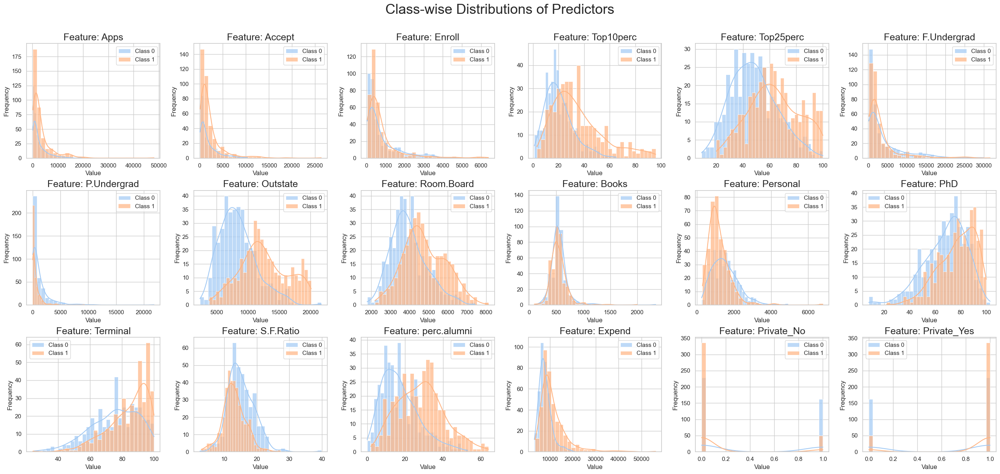

In [18]:
# Plot each numerical predictor across its classes of the response, display alongside statistial summary of each class level

from matplotlib import gridspec
palette = sns.set_palette('pastel')

def plot_classwise_distributions(X_df, class_column):
    # Get only the numerical columns and exclude the class column
    num_cols = X_df.select_dtypes(include=['int64', 'float64']).columns.drop(class_column)
    num_features = len(num_cols)

    # Create masks for each class for binary classes (0 and 1)
    class_masks = {cls: X_df[X_df[class_column] == cls] for cls in X_df[class_column].unique()}
    palette = sns.color_palette('pastel', n_colors=len(class_masks))

    # Layout calculations
    ncols = 6  # Number of columns per row 
    nrows = (num_features + ncols - 1) // ncols  # Rows needed for the columns
    fig = plt.figure(figsize=(26, 4 * nrows))
    gs = gridspec.GridSpec(nrows, ncols)

    def plot_hist(data, column, ax, color, label):
        sns.histplot(data=data, x=column, ax=ax, kde=True, bins=30, color=color, alpha=0.7, label=label)
        ax.legend()

    for i, col in enumerate(num_cols):
        ax = fig.add_subplot(gs[i // ncols, i % ncols])
        for cls, mask in class_masks.items():
            plot_hist(mask, col, ax, color=palette[cls], label=f'Class {cls}')
        ax.set_title(f'Feature: {col}', fontsize=18)
        ax.set_xlabel('Value', fontsize=12)
        ax.set_ylabel('Frequency', fontsize=12)

    plt.suptitle("Class-wise Distributions of Predictors", fontsize=26, y=1.02)
    plt.tight_layout(pad=0.6) 
    plt.show()


# Filter data for each class
Grad_Rate_0 = df.query("`Grad.Rate` == 0").describe() 
Grad_Rate_1 = df.query("`Grad.Rate` == 1").describe()

print("Below mean graduation rate (Grad.Rate = 0):")
display(Grad_Rate_0)
print("Above mean graduation rate (Grad.Rate = 1):")
display(Grad_Rate_1)

plot_classwise_distributions(df, 'Grad.Rate')

### Split and scale the data:

In [19]:
X = df.drop('Grad.Rate', axis = 1) #keep features only for X
y = df['Grad.Rate'] #keep target variable only for y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

Checking the class balances for the target across our training and testing split. It is good to see that the class sizes resemble those of the overall distribution. Now that we verified balance among the classes of both the overall distribution and train-test segments of Grad.Rate, we can proceed with scaling and modeling without the need to worry about techniques which correct class imbalances.   

In [20]:
# Produce the post-split count of both levels of Grad_Rate

print("y_train:")
print(f"{y_train.value_counts()[0]} observations, or {(y_train.value_counts(normalize =True)[0]*100).round(3)}%, are in class 0")
print(f"{y_train.value_counts()[1]} observations, or {(y_train.value_counts(normalize =True)[1]*100).round(3)}%, are in class 1\n")

print("y_test:")
print(f"{y_test.value_counts()[0]} observations, or {(y_test.value_counts(normalize =True)[0]*100).round(3)}%, are in class 0")
print(f"{y_test.value_counts()[1]} observations, or {(y_test.value_counts(normalize =True)[1]*100).round(3)}%, are in class 1")

y_train:
312 observations, or 50.242%, are in class 0
309 observations, or 49.758%, are in class 1

y_test:
79 observations, or 50.641%, are in class 0
77 observations, or 49.359%, are in class 1


In [21]:
sc = StandardScaler()

In [22]:
sc.fit(X_train)

#transform the train data
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)

#transform the test data
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

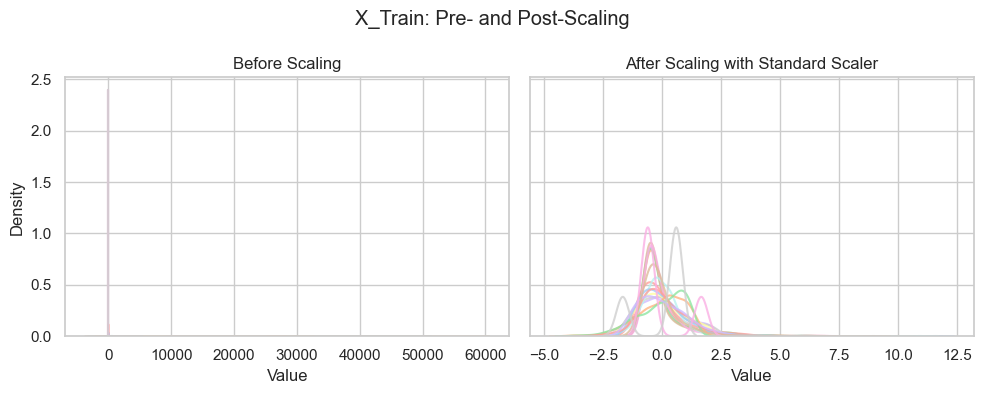

In [23]:
# View distribution of X-train before and after scaling 

fig, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)  # sharey to compare distributions directly
titles = ['Before Scaling', 'After Scaling with Standard Scaler']
data = [X_train, X_train_sc]  # List of dfs
for ax, title, df_copy in zip(axes, titles, data):
    ax.set_title(title)
    [sns.kdeplot(x=col, data=df_copy, ax=ax, alpha=0.8) for col in df_copy.columns]  # List comprehension
    ax.set_xlabel("Value")
plt.suptitle("X_Train: Pre- and Post-Scaling")
plt.tight_layout()
plt.show()

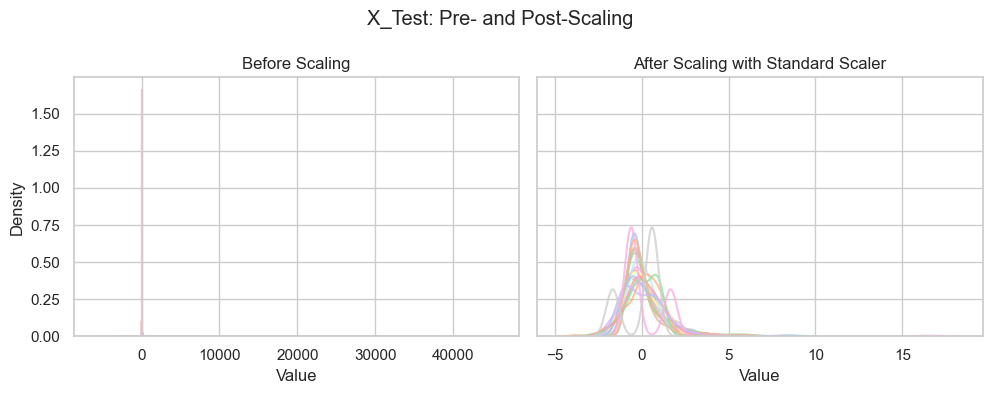

In [24]:
# View distribution of X-test before and after scaling 

fig, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)  # sharey to compare distributions directly
titles = ['Before Scaling', 'After Scaling with Standard Scaler']
data = [X_test, X_test_sc]  # List of dfs
for ax, title, df_copy in zip(axes, titles, data):
    ax.set_title(title)
    [sns.kdeplot(x=col, data=df_copy, ax=ax, alpha=0.8) for col in df_copy.columns]  # List comprehension
    ax.set_xlabel("Value")
plt.suptitle("X_Test: Pre- and Post-Scaling")
plt.tight_layout()
plt.show()

In [25]:
# Replacing with scaled test/train predictors 
X_train = X_train_sc
X_test = X_test_sc

In [26]:
y_train = y_train.reset_index(drop=True) 
X_train = X_train.reset_index(drop=True)

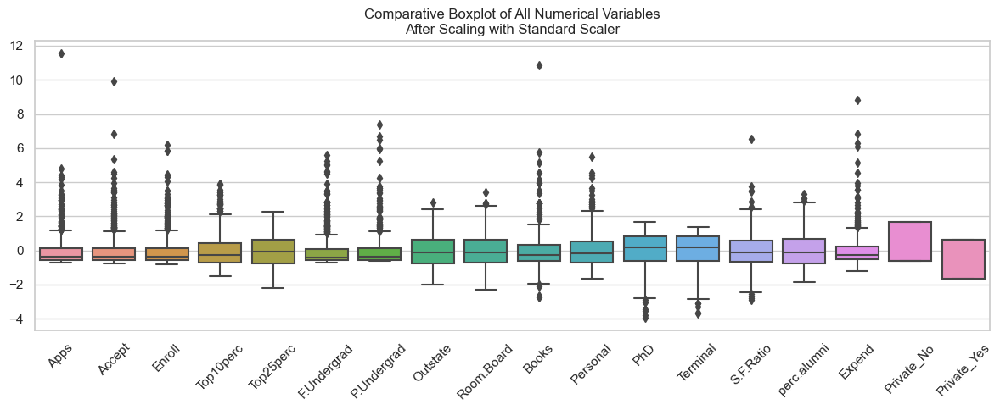

In [27]:
# comparitive boxplot of numerical variables after scaling

# create filtered df of only numerical data
num_cols_df = X_train_sc.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(12, 5))
sns.boxplot(data=num_cols_df)
plt.title('Comparative Boxplot of All Numerical Variables\nAfter Scaling with Standard Scaler')
plt.xticks(rotation=45) # rotate x-labels for readability
plt.tight_layout()
plt.show()

# Classification of Colleges by Graduation Rate
Below, we begin the classification task. We will implement three models: Logistic regression, decision tree classification, and random forest classification. Then, we will summarize and compare their performances. 

### Logistic Regression: 

In [28]:
from sklearn.linear_model import LogisticRegression

#Basic logistic regression model
logistic_initial = LogisticRegression(max_iter = 10000, random_state = 21)
logistic_initial.fit(X_train, y_train)

LogisticRegression(max_iter=10000, random_state=21)

In [29]:
# To explain importance of each predictor, first put them all in an easy to view format
#extract the coefficients of the logistic regression model and name it log_coef
log_coef = logistic_initial.coef_ 
log_coef

array([[ 0.79332512,  0.22957539,  0.59385362,  0.20147076,  0.19319275,
        -0.97516556, -0.16986786,  0.6577934 ,  0.32439662, -0.16710937,
        -0.21803738,  0.26737469, -0.08936934,  0.0237413 ,  0.61966187,
        -0.37654283, -0.17214886,  0.17214886]])

In [30]:
# To explain importance of each predictor, first put them all in an easy to view format
#extract the coefficients of the logistic regression model and name it log_coef
log_coef = logistic_initial.coef_ 

#convert the coef to a pandas data frame
df_log_coef = pd.DataFrame(log_coef)
#print(df_log_coef)

# Change the column names to the variable names
df_log_coef.columns = X_train.columns

# Transpose the data frame for better view
df_log_coef = df_log_coef.T

# renaming the column of the cefficient to logreg_coefficient
# logreg_coeff is corresponding logistic regression coefficients of the variable
df_log_coef = df_log_coef.rename(columns = {0:'LogisticCoefficient'}) 

#arrange the coefficients in an ascending order
df_log_coef = df_log_coef.sort_values('LogisticCoefficient')

# Reset the index so there are two seperate columns
df_log_coef = df_log_coef.reset_index()

# And rename the index column we just made
df_log_coef = df_log_coef.rename(columns = {'index':'VariableName'})

df_log_coef

,VariableName,LogisticCoefficient
0,F.Undergrad,-0.975166
1,Expend,-0.376543
2,Personal,-0.218037
3,Private_No,-0.172149
4,P.Undergrad,-0.169868
5,Books,-0.167109
6,Terminal,-0.089369
7,S.F.Ratio,0.023741
8,Private_Yes,0.172149
9,Top25perc,0.193193


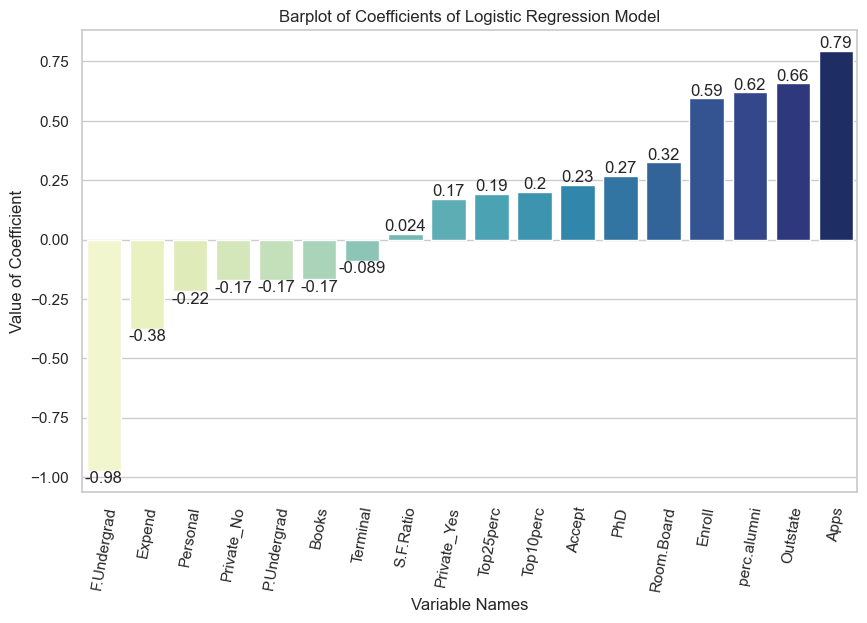

In [31]:
# Plot the magnitude of predictors from the model

plt.figure(figsize=(10, 6))
plot = sns.barplot(x="VariableName",y="LogisticCoefficient",data=df_log_coef, palette ="YlGnBu")
plot.bar_label(plot.containers[0], fmt='%.2g')
plt.xticks(rotation=80)
plt.title('Barplot of Coefficients of Logistic Regression Model')
plt.xlabel('Variable Names')
plt.ylabel('Value of Coefficient')
plt.show()

In [32]:
# Import necessary module for grid search cross-validation
from sklearn.model_selection import GridSearchCV

# Define the grid of hyperparameters to search over
grid = {
    "C": [0.001, 0.01, 0.1, 0.5, 1, 2, 5, 10, 20, 30, 40, 50, 100, 200],  # Regularization parameter values
    "penalty": ["l1", "l2"],  # Penalty norm for regularization
    "class_weight": [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:5}],  # Class weight options
    "solver": ['lbfgs', 'liblinear']  # Solver options
}

# Initialize a Logistic Regression model with a specified random state for reproducibility
logreg = LogisticRegression(random_state=21)

# Initialize a GridSearchCV object with the logistic regression model, hyperparameter grid, and 10-fold cross-validation
logreg_cv = GridSearchCV(logreg, grid, cv=2)

# Fit the GridSearchCV object to the training data
logreg_cv.fit(X_train, y_train)

# Print the best hyperparameters found during the search
print("Tuned hyperparameters: (best parameters)", logreg_cv.best_params_)

# Print the accuracy score achieved with the best hyperparameters
print("Accuracy:", logreg_cv.best_score_)

Tuned hyperparameters: (best parameters) {'C': 0.01, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy: 0.7858572762161602


/Users/mollyscally/anaconda3/envs/data3550/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
196 fits failed out of a total of 784.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
196 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/mollyscally/anaconda3/envs/data3550/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/mollyscally/anaconda3/envs/data3550/lib/python3.8/site-packages/sklearn/base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/mollyscally/anaconda3/envs/data3550/lib/python3.8/site-packages/skl

The grid search for the best value of C, class weight, penalty (regularization) term, and solver yields:  
{'C': 0.01, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'lbfgs'} 

Now, we initialize and fit the optimized logistic regression model with these hyperparameters and evaluate how much it improved its classification ability:  

In [33]:
logistic_best = LogisticRegression(random_state=21,      # Set the random state for reproducibility
                           C=0.01,                  # Regularization parameter
                           class_weight='balanced',  # Class weights to handle class imbalance
                           penalty='l2',         # Penalty norm for regularization
                           solver='lbfgs'    # Solver for optimization
                          )
logistic_best.fit(X_train, y_train)

LogisticRegression(C=0.01, class_weight='balanced', random_state=21)

In [34]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# Test by making prediction with our model
logistic_best_pred = logistic_best.predict(X_train)

# Accuracy First
score = logistic_best.score(X_train, y_train)
score_format = score * 100
score_format = 'Accuracy Score: {0:.2f}%'.format(score_format)
print(score_format)

#Then precision
precision = precision_score(y_train, logistic_best_pred)
precision_format = precision * 100
precision_format = 'Precision(PPV) Score: {0:.4f}%'.format(precision_format)
print(precision_format)

# And recall
recall = recall_score(y_train, logistic_best_pred)
recall_format = recall * 100
recall_format = 'Recall(Sensitivity) Score: {0:.4f}%'.format(recall_format)
print(recall_format)

Accuracy Score: 78.10%
Precision(PPV) Score: 79.7251%
Recall(Sensitivity) Score: 75.0809%


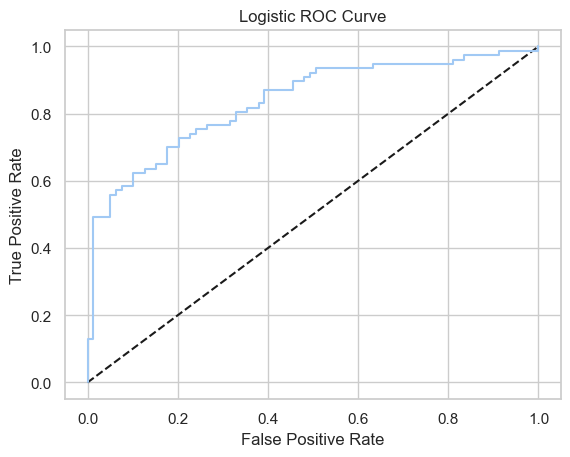

ROC AUC Score: 0.8358


In [35]:
model_pred = logistic_best.predict(X_test)
y_pred_prob = logistic_best.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic ROC Curve')
plt.show();

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, model_pred)


roc_auc = roc_auc_score(y_test, y_pred_prob)
roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
print(roc_auc_format)

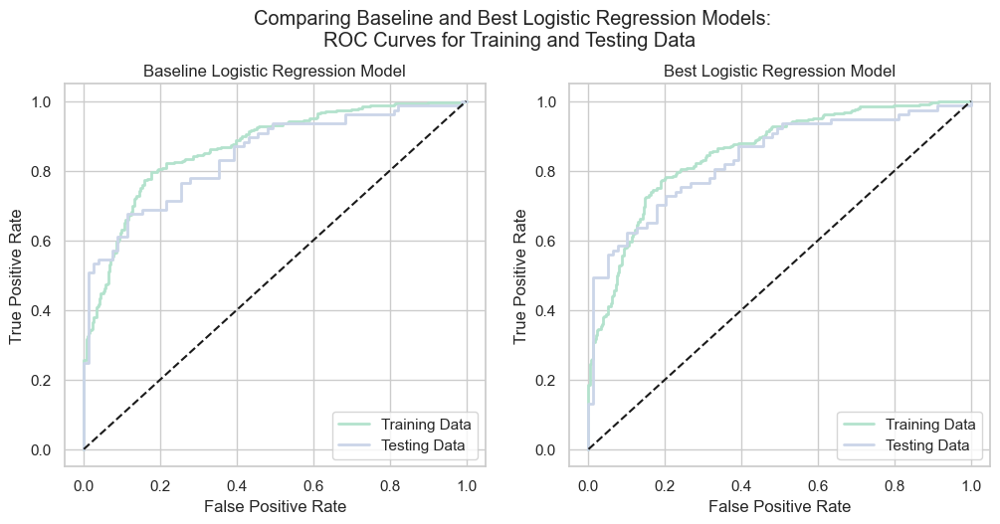

In [36]:
# Produce plot combining the ROC curves for model performance on training and testing data
palette = sns.color_palette('Pastel2', 20)

f, ax = plt.subplots(1, 2, figsize=(12, 5))

# Baseline model 
RocCurveDisplay.from_estimator(logistic_initial, X_train, y_train, label='Training Data', color=palette[0], linewidth=2, ax=ax[0]) # training ROC curve
RocCurveDisplay.from_estimator(logistic_initial, X_test, y_test, label='Testing Data', color=palette[10], linewidth=2, ax=ax[0]) # testing ROC curve

# Best model
RocCurveDisplay.from_estimator(logistic_best, X_train, y_train, label='Training Data', color=palette[0], linewidth=2, ax=ax[1]) # training ROC curve
RocCurveDisplay.from_estimator(logistic_best, X_test, y_test, label='Testing Data', color=palette[10], linewidth=2, ax=ax[1]) # testing ROC curve

ax[0].plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
ax[1].plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
ax[0].set_xlabel('False Positive Rate')
ax[0].set_ylabel('True Positive Rate')

ax[1].set_xlabel('False Positive Rate')
ax[1].set_ylabel('True Positive Rate')
ax[0].set_title('Baseline Logistic Regression Model')
ax[1].set_title('Best Logistic Regression Model')

plt.suptitle("Comparing Baseline and Best Logistic Regression Models:\nROC Curves for Training and Testing Data ", y=1.03)
plt.show()

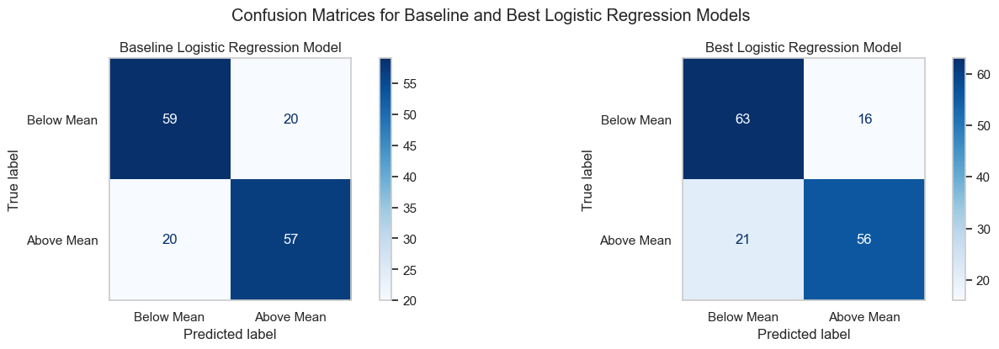

In [37]:
# Produce confusion matrices to compare predictions between baseline and best models

# Baseline model
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
train_confmat = ConfusionMatrixDisplay.from_estimator(logistic_initial, X_test, y_test, cmap="Blues",
                                                      display_labels=['Below Mean', 'Above Mean'],
                                                      values_format='d', ax=ax[0])
ax[0].set_title(f"Baseline Logistic Regression Model")
ax[0].grid(False)

# Tuned model
test_confmat = ConfusionMatrixDisplay.from_estimator(logistic_best, X_test, y_test, cmap="Blues",
                                                     display_labels=['Below Mean', 'Above Mean'],
                                                     values_format='d', ax=ax[1])
ax[1].set_title(f"Best Logistic Regression Model")
ax[1].grid(False)

plt.suptitle("Confusion Matrices for Baseline and Best Logistic Regression Models", x=0.53, y=1.01)
plt.tight_layout(pad=0.5)
plt.show()

### Decision Tree:

In [38]:
# Fit decision tree
dt_base = DecisionTreeClassifier(random_state=21)
dt_base.fit(X_train, y_train)
path = dt_base.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
model_pred = dt_base.predict(X_train)

Print performance scores on training data:

In [39]:
score = dt_base.score(X_train, y_train) * 100
print(f'{score:.2f}')

100.00


In [40]:
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')

100.00


In [41]:
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

100.00


Print performance scores on testing data:

In [42]:
model_pred = dt_base.predict(X_test)

In [43]:
score = dt_base.score(X_test, y_test) * 100
print(f'{score:.2f}')

75.64


In [44]:
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')

79.10


In [45]:
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

68.83


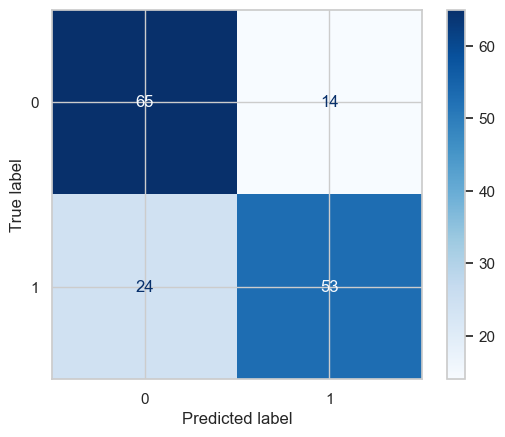

In [46]:
# Plot confusion matrix
confmat = ConfusionMatrixDisplay.from_estimator(dt_base, X_test, y_test, cmap="Blues")

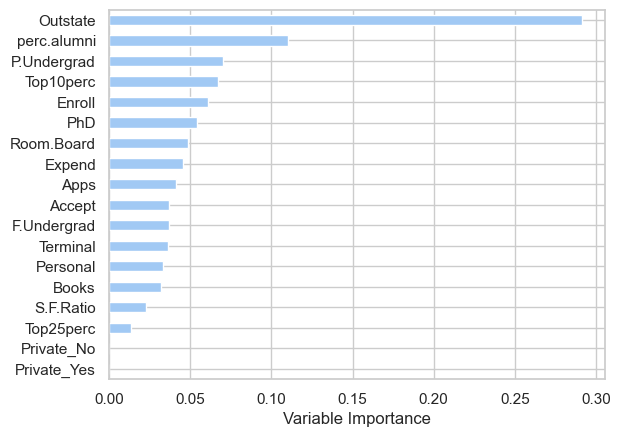

In [47]:
# Plot variable importance
Importance = pd.DataFrame({'Importance':dt_base.feature_importances_}, index=X.columns)
Importance.sort_values('Importance', axis=0, ascending=True).plot(kind='barh',  color='b',linewidth = 1 )
plt.xlabel('Variable Importance')
plt.gca().legend_ = None
plt.show()

In [48]:
# Fit decision tree with fixed depth
dt_base2 = DecisionTreeClassifier(max_depth=5, random_state=21)
dt_base2.fit(X_train, y_train)
model_pred = dt_base2.predict(X_test)

In [49]:
# Print performance scores on testing data:
score = dt_base2.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.00
77.14
70.13


In [50]:
plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(32, 20), dpi=400)
# Plot decision tree
plot_tree(dt_base2, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Low Grad Rate", "High Grad Rate"], 
          feature_names=X_train.columns.to_list()); 

In [51]:
ccp_alphas

array([0.        , 0.00147611, 0.00148644, 0.00154029, 0.00154589,
       0.00158254, 0.00214707, 0.00214707, 0.00214707, 0.00241546,
       0.00257649, 0.00263505, 0.00268384, 0.00268384, 0.00268384,
       0.00268384, 0.00276052, 0.00276052, 0.00278527, 0.00283762,
       0.00288395, 0.00292783, 0.00309674, 0.00311126, 0.00338164,
       0.00356683, 0.00364853, 0.00396269, 0.00406352, 0.00415397,
       0.00425905, 0.00428021, 0.00429415, 0.00429415, 0.00438361,
       0.00442483, 0.00460087, 0.00461133, 0.0047566 , 0.00476829,
       0.0048647 , 0.00488843, 0.00554318, 0.00566851, 0.00581455,
       0.00585566, 0.00609304, 0.00679514, 0.00824088, 0.00827499,
       0.0132528 , 0.01392426, 0.01860402, 0.03537302, 0.12801018])

In [52]:
# Define parameter grid
param_grid = {
'criterion': ['gini', 'entropy', 'log_loss'],
'max_features': [None, 'sqrt', 'log2'],
'ccp_alpha': ccp_alphas
}
# Create a decision tree model
dt_opt = DecisionTreeClassifier(random_state=21)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=21)
# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=dt_opt, param_grid=param_grid, cv=cv, scoring='accuracy', n_jobs =-1)
grid_search.fit(X_train,y_train)

print("tuned hyperparameters: ",grid_search.best_params_)
print("accuracy: ",grid_search.best_score_)

tuned hyperparameters:  {'ccp_alpha': 0.018604016046471286, 'criterion': 'entropy', 'max_features': None}
accuracy:  0.7549155145929339


In [53]:
# Train model
dt_best = DecisionTreeClassifier(random_state=21, ccp_alpha=0.018604016046471286, criterion='entropy', max_features=None)
dt_best.fit(X_train, y_train)
model_pred = dt_best.predict(X_train)

In [54]:
# Print performance scores with training data
score = dt_best.score(X_train, y_train) * 100
print(f'{score:.2f}')
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

80.68
85.66
73.46


In [55]:
# Print performance scores with test data
model_pred = dt_best.predict(X_test)
score = dt_best.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.64
81.97
64.94


In [56]:
print(classification_report(y_test, model_pred))

              precision    recall  f1-score   support

           0       0.72      0.86      0.78        79
           1       0.82      0.65      0.72        77

    accuracy                           0.76       156
   macro avg       0.77      0.76      0.75       156
weighted avg       0.77      0.76      0.75       156



Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

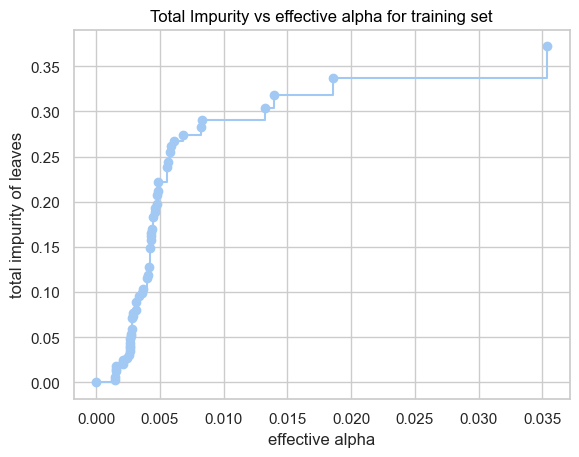

In [57]:
# Plot impurity vs alpha
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [58]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)

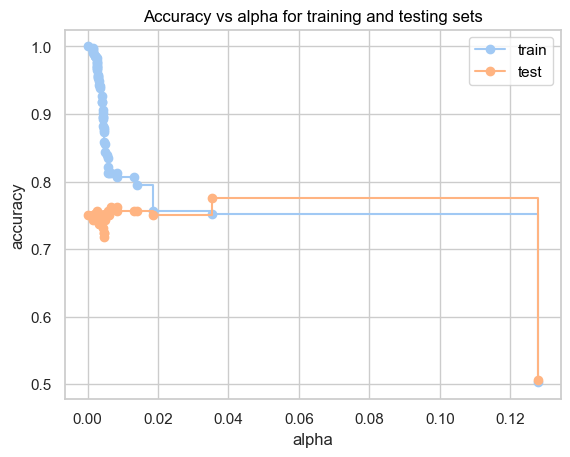

In [59]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]
# Plot accuracy vs alphas
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [60]:
plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(32, 20), dpi=400)
# Plot decision tree
plot_tree(dt_best, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Low Grad Rate", "High Grad Rate"], 
          feature_names=X_train.columns.to_list());

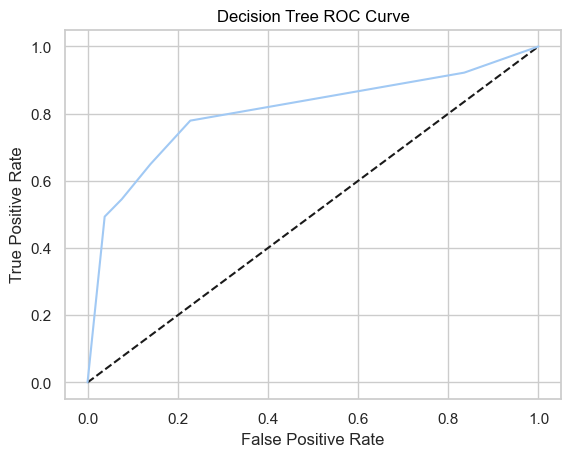

ROC AUC Score: 0.8052


In [61]:
y_pred_prob = dt_best.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve')
plt.show();

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, model_pred)


roc_auc = roc_auc_score(y_test, y_pred_prob)
roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
print(roc_auc_format)

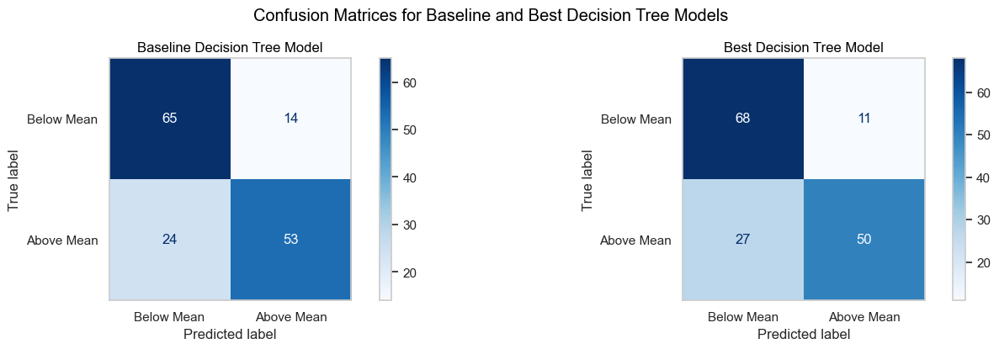

In [62]:
# Produce confusion matrices to compare predictions between baseline and best models

# Baseline model
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
train_confmat = ConfusionMatrixDisplay.from_estimator(dt_base, X_test, y_test, cmap="Blues",
                                                      display_labels=['Below Mean', 'Above Mean'],
                                                      values_format='d', ax=ax[0])
ax[0].set_title(f"Baseline Decision Tree Model")
ax[0].grid(False)

# Tuned model
test_confmat = ConfusionMatrixDisplay.from_estimator(dt_best, X_test, y_test, cmap="Blues",
                                                     display_labels=['Below Mean', 'Above Mean'],
                                                     values_format='d', ax=ax[1])
ax[1].set_title(f"Best Decision Tree Model")
ax[1].grid(False)

plt.suptitle("Confusion Matrices for Baseline and Best Decision Tree Models", x=0.53, y=1.01)
plt.tight_layout(pad=0.5)
plt.show()

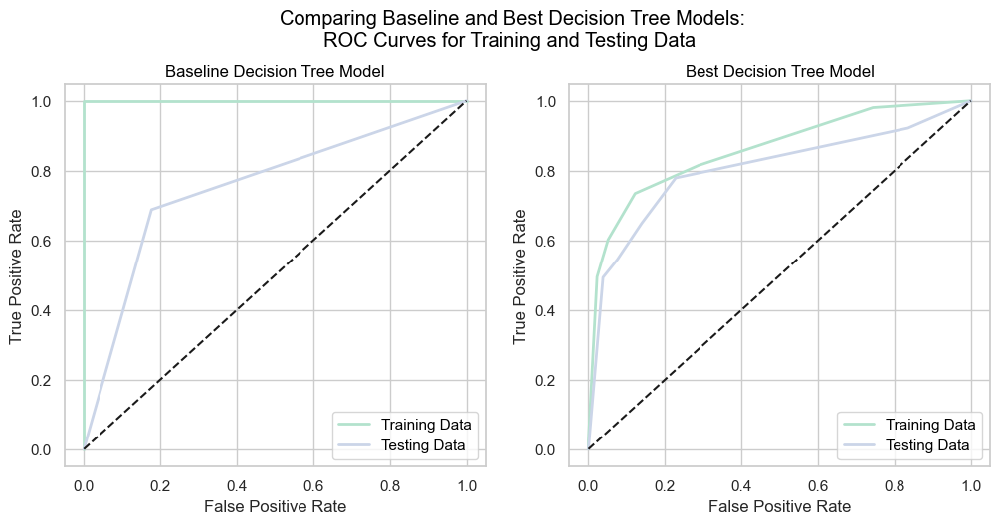

In [63]:
# Produce plot combining the ROC curves for model performance on training and testing data
palette = sns.color_palette('Pastel2', 20)

f, ax = plt.subplots(1, 2, figsize=(12, 5))

# Baseline model 
RocCurveDisplay.from_estimator(dt_base, X_train, y_train, label='Training Data', color=palette[0], linewidth=2, ax=ax[0]) # training ROC curve
RocCurveDisplay.from_estimator(dt_base, X_test, y_test, label='Testing Data', color=palette[10], linewidth=2, ax=ax[0]) # testing ROC curve

# Best model
RocCurveDisplay.from_estimator(dt_best, X_train, y_train, label='Training Data', color=palette[0], linewidth=2, ax=ax[1]) # training ROC curve
RocCurveDisplay.from_estimator(dt_best, X_test, y_test, label='Testing Data', color=palette[10], linewidth=2, ax=ax[1]) # testing ROC curve

ax[0].plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
ax[1].plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
ax[0].set_xlabel('False Positive Rate')
ax[0].set_ylabel('True Positive Rate')

ax[1].set_xlabel('False Positive Rate')
ax[1].set_ylabel('True Positive Rate')
ax[0].set_title('Baseline Decision Tree Model')
ax[1].set_title('Best Decision Tree Model')

plt.suptitle("Comparing Baseline and Best Decision Tree Models:\nROC Curves for Training and Testing Data ", y=1.03)
plt.show()

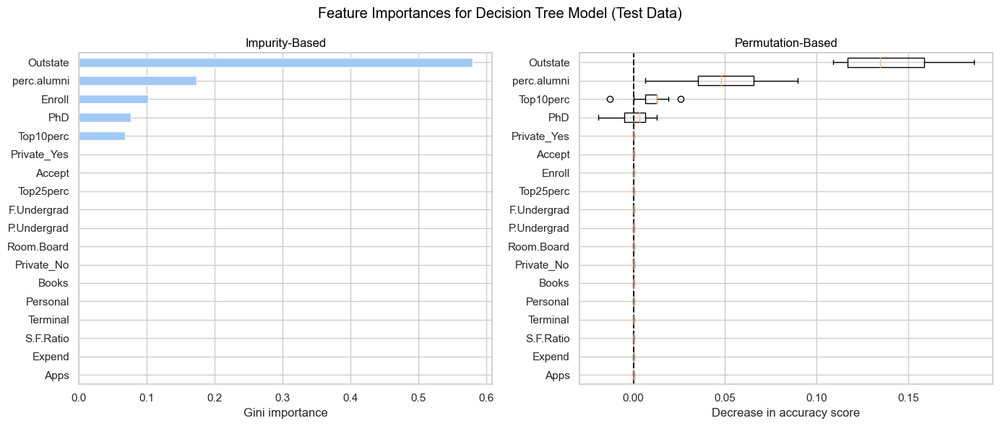

In [64]:
# Feature importance: side-by-side plot for impurity vs permutation

mdi_importances = pd.Series(dt_best.feature_importances_, index=X_test.columns)
tree_importance_sorted_idx = np.argsort(dt_best.feature_importances_)
tree_indices = np.arange(0, len(dt_best.feature_importances_)) + 0.5

from sklearn.inspection import permutation_importance

def plot_permutation_importance(clf, X, y, ax):
    result = permutation_importance(clf, X, y, n_repeats=10, random_state=42, n_jobs=2)
    perm_sorted_idx = result.importances_mean.argsort()

    ax.boxplot(
        result.importances[perm_sorted_idx].T,
        vert=False,
        labels=X.columns[perm_sorted_idx],
    )
    ax.axvline(x=0, color="k", linestyle="--")
    return ax

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
mdi_importances.sort_values().plot.barh(ax=ax1)
ax1.set_title("Impurity-Based", fontsize=12)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(dt_best, X_test, y_test, ax2)
ax2.set_title("Permutation-Based", fontsize=12)
ax2.set_xlabel("Decrease in accuracy score")
fig.suptitle(
    "Feature Importances for Decision Tree Model (Test Data)"
)
_ = fig.tight_layout()

# Random Forest Classification

In [65]:
# Define function to print classification metrics and train/test differences to help identify overfitting or underfitting  

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss

def print_classification_metrics_and_diff(model, X_train, y_train, X_test, y_test):
    
    datasets = [('Train', X_train, y_train), ('Test', X_test, y_test)]
    metrics_list = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC ROC', 'Log Loss']
    metrics_functions = {
        'Accuracy': accuracy_score,
        'Precision': precision_score,
        'Recall': recall_score,
        'F1': f1_score,
        'AUC ROC': roc_auc_score,
        'Log Loss': log_loss
    }
    results = {'Train': {}, 'Test': {}}

    print(f"Metrics for {model}:")
    
    for name, X, y in datasets:
        y_pred = model.predict(X)
        y_pred_proba = model.predict_proba(X)[:, 1] if 'predict_proba' in dir(model) else None
        for metric in metrics_list:
            if metric in ['AUC ROC', 'Log Loss'] and y_pred_proba is not None:
                score = metrics_functions[metric](y, y_pred_proba) if metric != 'Log Loss' else metrics_functions[metric](y, y_pred_proba, labels=np.unique(y))
            elif metric in ['Precision', 'Recall', 'F1']:
                score = metrics_functions[metric](y, y_pred, average='binary')
            else:
                score = metrics_functions[metric](y, y_pred)
            results[name][metric] = score
    
    print(f"\n{'Metric':<12} {'Train':<10} {'Test':<10}")
    print("-" * 32)
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        # Handle Log Loss differently
        if metric == 'Log Loss':
            print(f"{metric:<12} {train_score:.4f}       {test_score:.4f}")
        else:
            print(f"{metric:<12} {train_score*100:.2f}%     {test_score*100:.2f}%")
    
    print("\nDifferences (Train - Test):")
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        diff = (train_score - test_score) if metric == 'Log Loss' else (train_score - test_score) * 100
        direction = "increased" if diff < 0 else "decreased"

        if metric == 'Log Loss':
            print(f"{metric} {direction} by {abs(diff):.4f}")
        else:
            print(f"{metric} {direction} by {abs(diff):.2f}%")

# print_classification_metrics_and_diff(model)

Below, the baseline random forest classifier is fit on the data with only the default parameters and a random state of 21 for reproducibility.   

In [66]:
# Fit the baseline RF classifier model
from sklearn.ensemble import RandomForestClassifier 

rfc_base = RandomForestClassifier(random_state = 21) 
rfc_base.fit(X_train, y_train)

RandomForestClassifier(random_state=21)

The random forest model scores with default parameters (100 trees) are shown below. The model learned the intricacies of the training set perfectly, indicated by the training-set scores all being "100%". The model generalized poorly on the test data in across all metrics, dropping nearly 20% all around.  

In [67]:
# Print model performance results for the baseline RF classifier model

print_classification_metrics_and_diff(rfc_base, X_train, y_train, X_test, y_test)

Metrics for RandomForestClassifier(random_state=21):

Metric       Train      Test      
--------------------------------
Accuracy     100.00%     76.28%
Precision    100.00%     78.57%
Recall       100.00%     71.43%
F1           100.00%     74.83%
AUC ROC      100.00%     83.66%
Log Loss     0.1322       0.5047

Differences (Train - Test):
Accuracy decreased by 23.72%
Precision decreased by 21.43%
Recall decreased by 28.57%
F1 decreased by 25.17%
AUC ROC decreased by 16.34%
Log Loss increased by 0.3724


The random forest model has multiple hyperparameters. Certain ones, such as n_estimators and max_features, can increase the computational load significantly, especially when we add cross validation. To search efficiently, hyperparemters will be tuned in two phases. First, a randomized search across distributions of the model's possible parameters will reveal a candidate set.  After that, the local neighborhood of the candidate set will comprise a narrower grid to be searched for the best parameters. Because the target's classes are balanced, accuracy is used for scoring in the randomized search, which can also make the broad filtering of best parameters more efficient. Then, the narrow grid search will ensure well-roundedness by using multiple scoring metrics and then refitting on accuracy. 

In [68]:
# Un-comment the following command if you wish to avoid the lengthy grid searches
# (Final random forest model is already initialized with parameters below)

# import sys
# # Stop the execution of the notebook
# sys.exit("Stopping the notebook execution intentionally at this cell.")

SystemExit: Stopping the notebook execution intentionally at this cell.

/Users/mollyscally/anaconda3/envs/data3550/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
# Randomized search of wide param grid

from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    "n_estimators": range(100, 2001, 100),          # Number of trees in the forest
    'max_depth': [None, 5, 10, 20, 30, 50],         # Maximum depth of the tree
    "min_samples_split": range(2, 15),              # Minimum number of samples required to split an internal node
    "min_samples_leaf": range(1, 11),               # Minimum number of samples required at a leaf node
    'max_features': [None, 'sqrt', 'log2'],         # The number of features to consider when looking for the best split
    'bootstrap': [True, False],                     # Whether bootstrap samples are used when building trees
    'max_leaf_nodes': [None, 50, 100, 150],         # Maximum number of leaf nodes
    'min_impurity_decrease': [0.0, 0.01, 0.1],      # A node will be split if this split induces a decrease of the impurity greater than this value
    'class_weight': [None, 'balanced'],             # Weights associated with classes. If 'balanced', uses the values of y to automatically adjust weights inversely proportional to class frequencies
    'criterion': ['gini', 'entropy', 'log_loss'],   # The function to measure the quality of a split
}

rfc = RandomForestClassifier(random_state=21)  # Initialize base model

# Setup RandomizedSearchCV
rfc_random_search = RandomizedSearchCV(rfc, param_distributions=param_dist, n_iter=100, scoring='accuracy', cv=5, verbose=1, random_state=21, n_jobs=-1)

# Fit RandomizedSearchCV
rfc_random_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=21),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'class_weight': [None, 'balanced'],
                                        'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [None, 5, 10, 20, 30, 50],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'max_leaf_nodes': [None, 50, 100, 150],
                                        'min_impurity_decrease': [0.0, 0.01,
                                                                  0.1],
                                        'min_samples_leaf': range(1, 11),
                                        'min_samples_split': range(2, 15),
                                        'n_estimators': range(100, 2001, 100)},
                   random_state=21, scoring='accuracy', verbose=1)

In [ ]:
# Extract and show parameters from randomized search

print("Best parameters from wide search (using RandomizedSearchCV):")
rfc_best_params = rfc_random_search.best_params_  
rfc_best_params

Best parameters from RandomizedSearchCV:


{'n_estimators': 1100,
 'min_samples_split': 8,
 'min_samples_leaf': 6,
 'min_impurity_decrease': 0.01,
 'max_leaf_nodes': None,
 'max_features': None,
 'max_depth': 50,
 'criterion': 'gini',
 'class_weight': None,
 'bootstrap': True}

The results of the narrow grid search are shown below. The imperfect training scores indicate the tuning so far has already improved the overfitting situation from the baseline model.  

In [ ]:
# Get metrics for randomized search

print_classification_metrics_and_diff(rfc_random_search, X_train, y_train, X_test, y_test)

Metrics for RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=21),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'class_weight': [None, 'balanced'],
                                        'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [None, 5, 10, 20, 30, 50],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'max_leaf_nodes': [None, 50, 100, 150],
                                        'min_impurity_decrease': [0.0, 0.01,
                                                                  0.1],
                                        'min_samples_leaf': range(1, 11),
                                        'min_samples_split': range(2, 15),
                                        'n_estim

Set up the narrower grid using the found parameters from the randomized search. A small area surrounding some of the most crucial numerical parameters will be searched. The categorical ones will just be the chosen ones from the randomized search.  

In [ ]:
# Extract best parameters from randomized search and conduct search of narrower grid

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score, recall_score, roc_auc_score

# Scoring metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'sensitivity': make_scorer(recall_score),  # Positive class recall
    'specificity': make_scorer(recall_score, pos_label=0),  # Negative class recall
    'AUC': 'roc_auc'
}

narrow_grid = {
    "n_estimators": [rfc_best_params['n_estimators'] - 50, rfc_best_params['n_estimators'], rfc_best_params['n_estimators'] + 50],  # +/- 50
    "max_depth": [rfc_best_params['max_depth'] - 5, rfc_best_params['max_depth'], rfc_best_params['max_depth'] + 5],  # +/- 5
    "min_samples_split": [rfc_best_params['min_samples_split'] - 1, rfc_best_params['min_samples_split'], rfc_best_params['min_samples_split'] + 1],  # +/- 1
    "min_samples_leaf": [rfc_best_params['min_samples_leaf'] - 1, rfc_best_params['min_samples_leaf'], rfc_best_params['min_samples_leaf'] + 1],  # +/- 1
    "max_features": [rfc_best_params['max_features']],  # same
    "bootstrap": [rfc_best_params['bootstrap']],  # same
    "max_leaf_nodes": [rfc_best_params['max_leaf_nodes']],
    'min_impurity_decrease': [rfc_best_params['min_impurity_decrease']],  # same
    'class_weight': [rfc_best_params['class_weight']],  # same
    'criterion': [rfc_best_params['criterion']]  # same
}

# Setup GridSearchCV with the base model
rfc_focused_search = GridSearchCV(rfc, narrow_grid, scoring=scoring, cv=5, refit='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV
rfc_focused_search.fit(X_train, y_train)

Fitting 5 folds for each of 81 candidates, totalling 405 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=21), n_jobs=-1,
             param_grid={'bootstrap': [True], 'class_weight': [None],
                         'criterion': ['gini'], 'max_depth': [40, 45, 50],
                         'max_features': [None], 'max_leaf_nodes': [None],
                         'min_impurity_decrease': [0.01],
                         'min_samples_leaf': [4, 5, 6],
                         'min_samples_split': [6, 7, 8],
                         'n_estimators': [1050, 1100, 1150]},
             refit='accuracy',
             scoring={'AUC': 'roc_auc', 'accuracy': make_scorer(accuracy_score),
                      'sensitivity': make_scorer(recall_score),
                      'specificity': make_scorer(recall_score, pos_label=0)},
             verbose=1)

In [ ]:
# Get best parameters from grid search

print("Best parameters from narrow search (GridSearchCV):")
rfc_best_params = rfc_focused_search.best_params_
rfc_best_params

Best parameters from narrow search (GridSearchCV):


{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 40,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.01,
 'min_samples_leaf': 5,
 'min_samples_split': 6,
 'n_estimators': 1100}

The metrics from the grid search object are shown for verification:

In [ ]:
# Get metrics from grid search

print_classification_metrics_and_diff(rfc_focused_search, X_train, y_train, X_test, y_test)

Metrics for GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=21), n_jobs=-1,
             param_grid={'bootstrap': [True], 'class_weight': [None],
                         'criterion': ['gini'], 'max_depth': [40, 45, 50],
                         'max_features': [None], 'max_leaf_nodes': [None],
                         'min_impurity_decrease': [0.01],
                         'min_samples_leaf': [4, 5, 6],
                         'min_samples_split': [6, 7, 8],
                         'n_estimators': [1050, 1100, 1150]},
             refit='accuracy',
             scoring={'AUC': 'roc_auc', 'accuracy': make_scorer(accuracy_score),
                      'sensitivity': make_scorer(recall_score),
                      'specificity': make_scorer(recall_score, pos_label=0)},
             verbose=1):

Metric       Train      Test      
--------------------------------
Accuracy     81.80%     77.56%
Precision    84.75%     80.88%
Recall       77.35%     71.43%
F1           

The best parameters are then initialized into the best model: 

In [69]:
# Initialize best rfc model with the best params

# rfc_best = RandomForestClassifier(random_state=21, **rfc_best_params)  # this version automatically transfer the best params into the model definition

rfc_best = RandomForestClassifier(random_state=21, criterion='gini', max_depth=40, max_features=None,
                                 max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=5, min_samples_split=6, n_estimators=1100) 

The repeated 10-fold cross-validation is conducted now to ensure performance assessment is comprehensive. 

In [71]:
# Conduct the cross validation using the unfitted model

from sklearn.model_selection import RepeatedStratifiedKFold, cross_validate
from sklearn.metrics import make_scorer, accuracy_score, recall_score, roc_auc_score

# Scoring metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'sensitivity': make_scorer(recall_score),  # Positive class recall
    'specificity': make_scorer(recall_score, pos_label=0),  # Negative class recall
    'AUC': 'roc_auc'
}

# CV strategy
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=21)

# Cross validate and obtain scores 
RfC_scores = cross_validate(rfc_best, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True, verbose=True, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   31.9s finished


In [72]:
# Fit the best model

rfc_best.fit(X_train, y_train)

RandomForestClassifier(max_depth=40, max_features=None,
                       min_impurity_decrease=0.01, min_samples_leaf=5,
                       min_samples_split=6, n_estimators=1100, random_state=21)

Below, the scores for the RF model with optimally tuned hyperparameters is shown. Although the test metrics did not significantly rise, we see a drastic diminishing between the difference in train vs. test performances. This suggests that the tuned model is much more less prone to overfitting i.e. generalizable towards unseen data, and its predictions should be more reliable. 

The resulting model was tuned more broadly based on accuracy and then narrowly on a comprehensive balance between accuracy, sensitivity (TPR), specificity (FPR) and AUC. 

In [73]:
# Get the metrics for the fitted best RFC model 

print_classification_metrics_and_diff(rfc_best, X_train, y_train, X_test, y_test)

Metrics for RandomForestClassifier(max_depth=40, max_features=None,
                       min_impurity_decrease=0.01, min_samples_leaf=5,
                       min_samples_split=6, n_estimators=1100, random_state=21):

Metric       Train      Test      
--------------------------------
Accuracy     81.80%     77.56%
Precision    84.75%     80.88%
Recall       77.35%     71.43%
F1           80.88%     75.86%
AUC ROC      90.76%     83.53%
Log Loss     0.4070       0.4874

Differences (Train - Test):
Accuracy decreased by 4.24%
Precision decreased by 3.87%
Recall decreased by 5.92%
F1 decreased by 5.02%
AUC ROC decreased by 7.23%
Log Loss increased by 0.0803


The confusion matrices for test and train data as well as the classification report (for test data) are below. 

In [74]:
# Print the classification report

y_test_pred = rfc_best.predict(X_test)  # Generate predictions on the testing data
print("\nTest-data classification report:\n", classification_report(y_test, y_test_pred))  # Print the classification report


Test-data classification report:
               precision    recall  f1-score   support

           0       0.75      0.84      0.79        79
           1       0.81      0.71      0.76        77

    accuracy                           0.78       156
   macro avg       0.78      0.77      0.77       156
weighted avg       0.78      0.78      0.77       156



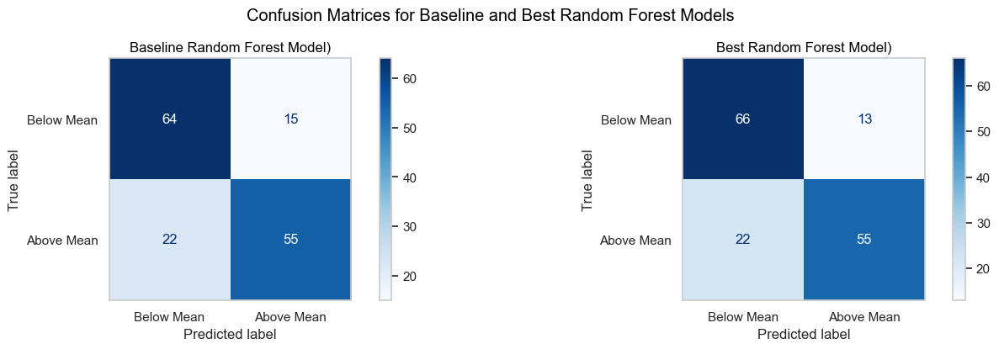

In [75]:
# Produce confusion matrices to compare predictions between baseline and best models

# Baseline model
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
train_confmat = ConfusionMatrixDisplay.from_estimator(rfc_base, X_test, y_test, cmap="Blues",
                                                      display_labels=['Below Mean', 'Above Mean'],
                                                      values_format='d', ax=ax[0])
ax[0].set_title(f"Baseline Random Forest Model)")
ax[0].grid(False)

# Tuned model
test_confmat = ConfusionMatrixDisplay.from_estimator(rfc_best, X_test, y_test, cmap="Blues",
                                                     display_labels=['Below Mean', 'Above Mean'],
                                                     values_format='d', ax=ax[1])
ax[1].set_title(f"Best Random Forest Model)")
ax[1].grid(False)

plt.suptitle("Confusion Matrices for Baseline and Best Random Forest Models", x=0.53, y=1.01)
plt.tight_layout(pad=0.5)
plt.show()

The ROC curves are shown for training and testing data. The testing data 

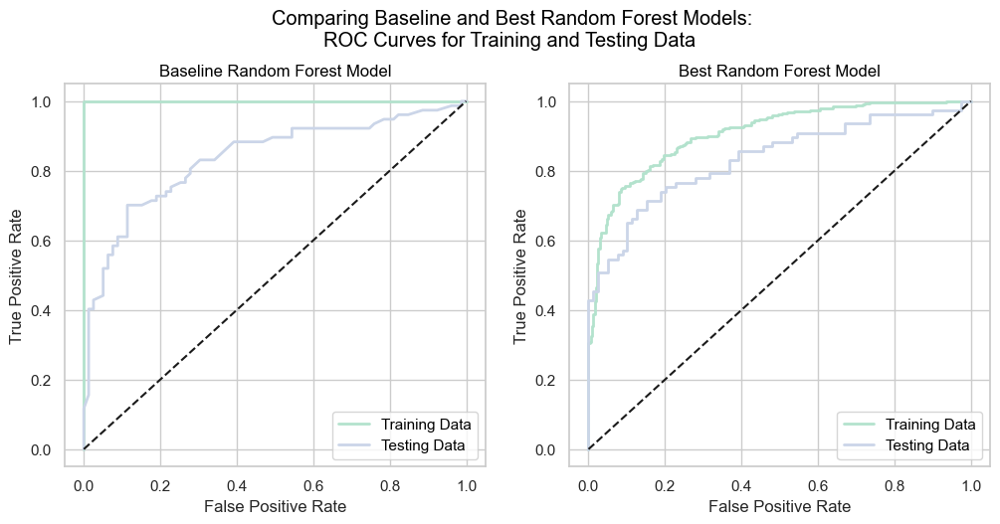

In [76]:
# Produce plot combining the ROC curves for model performance on training and testing data
palette = sns.color_palette('Pastel2', 20)

f, ax = plt.subplots(1, 2, figsize=(12, 5))
RocCurveDisplay.from_estimator(rfc_base, X_train, y_train, label='Training Data', color=palette[0], linewidth=2, ax=ax[0]) # training ROC curve
RocCurveDisplay.from_estimator(rfc_base, X_test, y_test, label='Testing Data', color=palette[10], linewidth=2, ax=ax[0]) # testing ROC curve

RocCurveDisplay.from_estimator(rfc_best, X_train, y_train, label='Training Data', color=palette[0], linewidth=2, ax=ax[1]) # training ROC curve
RocCurveDisplay.from_estimator(rfc_best, X_test, y_test, label='Testing Data', color=palette[10], linewidth=2, ax=ax[1]) # testing ROC curve
ax[0].plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
ax[1].plot([0, 1], [0, 1],'k--')  # Plot the diagonal line representing random guess
ax[0].set_xlabel('False Positive Rate')
ax[0].set_ylabel('True Positive Rate')

ax[1].set_xlabel('False Positive Rate')
ax[1].set_ylabel('True Positive Rate')
ax[0].set_title('Baseline Random Forest Model')
ax[1].set_title('Best Random Forest Model')

plt.suptitle("Comparing Baseline and Best Random Forest Models:\nROC Curves for Training and Testing Data ", y=1.03)
plt.show()

Below, the most important features for the RF model's predictions are ranked via two methods: their reduction in impurity as well as their drop in model accuracy after permutation (a disruption of its correlation with the target). Relying solely on the impurity-based approach carries the risk of overestimating feature importances of features with many unique values (source: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py) 

We see that the RF model's top predictors by both measures include Outstate and perc.alumni, and a slightly different order from there after. Some predictors' rank is drastically different by the two measures: For example, Room.Board is the 6th most important by its reduction in Gini impurity, but it is 3rd to last when it comes to its contribution to overall accuracy. Considering both these measures might be a useful thing to consider if we were to try reducing the size of this model. 

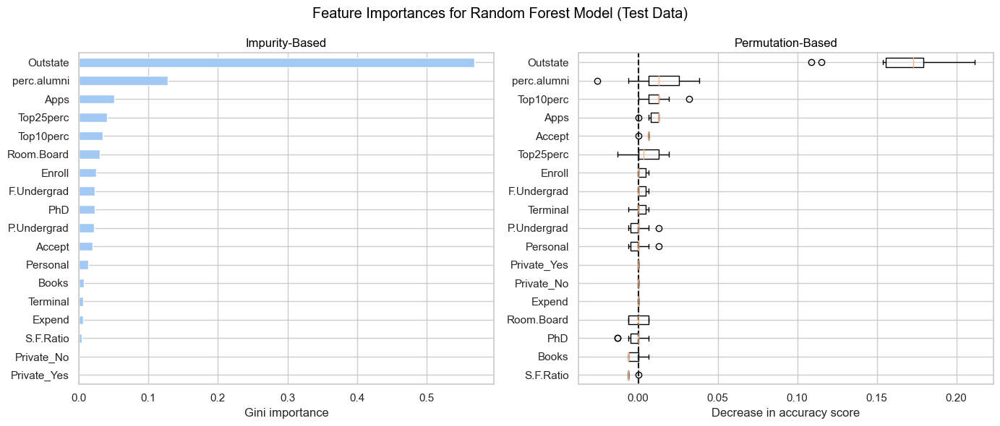

In [77]:
# Feature importance: side-by-side plot for impurity vs permutation

mdi_importances = pd.Series(rfc_best.feature_importances_, index=X_test.columns)
tree_importance_sorted_idx = np.argsort(rfc_best.feature_importances_)
tree_indices = np.arange(0, len(rfc_best.feature_importances_)) + 0.5

from sklearn.inspection import permutation_importance

def plot_permutation_importance(clf, X, y, ax):
    result = permutation_importance(clf, X, y, n_repeats=10, random_state=42, n_jobs=2)
    perm_sorted_idx = result.importances_mean.argsort()

    ax.boxplot(
        result.importances[perm_sorted_idx].T,
        vert=False,
        labels=X.columns[perm_sorted_idx],
    )
    ax.axvline(x=0, color="k", linestyle="--")
    return ax

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
mdi_importances.sort_values().plot.barh(ax=ax1)
ax1.set_title("Impurity-Based", fontsize=12)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(rfc_best, X_test, y_test, ax2)
ax2.set_title("Permutation-Based", fontsize=12)
ax2.set_xlabel("Decrease in accuracy score")
fig.suptitle(
    "Feature Importances for Random Forest Model (Test Data)"
)
_ = fig.tight_layout()

## Classification Model Summary

Below is the dataframe of all three models' metrics. 

In [79]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss

def evaluate_classification_model(model, X_train, y_train, X_test, y_test):
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Probabilities for AUC and log loss
    y_train_proba = model.predict_proba(X_train)[:, 1]
    y_test_proba = model.predict_proba(X_test)[:, 1]
    
    # Compute metrics
    metrics = {
        'Train Accuracy': accuracy_score(y_train, y_train_pred),
        'Test Accuracy': accuracy_score(y_test, y_test_pred),
        'Train Precision': precision_score(y_train, y_train_pred, average='weighted'),
        'Test Precision': precision_score(y_test, y_test_pred, average='weighted'),
        'Train Recall': recall_score(y_train, y_train_pred, average='weighted'),
        'Test Recall': recall_score(y_test, y_test_pred, average='weighted'),
        'Train F1': f1_score(y_train, y_train_pred, average='weighted'),
        'Test F1': f1_score(y_test, y_test_pred, average='weighted'),
        'Train AUC ROC': roc_auc_score(y_train, y_train_proba, multi_class='ovr'),
        'Test AUC ROC': roc_auc_score(y_test, y_test_proba, multi_class='ovr')
    }
    
    # Add differences between train/test
    for metric in ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC ROC']:
        train_metric = metrics[f'Train {metric}']
        test_metric = metrics[f'Test {metric}']
        metrics[f'{metric} Diff'] = test_metric - train_metric
    
    return metrics

def classification_metrics_df(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        metrics = evaluate_classification_model(model, X_train, y_train, X_test, y_test)
        metrics_row = {'Model': name, **metrics}  
        results.append(metrics_row)
    
    metrics_df = pd.DataFrame(results)
    return metrics_df

models = {
    'Logistic Regression': logistic_best,  
    'Decision Tree Classifier': dt_best, 
    'Random Forest Classifier': rfc_best
}

metrics_df = classification_metrics_df(models, X_train, y_train, X_test, y_test)
metrics_df = metrics_df.set_index('Model')
metrics_df

,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1,Test F1,Train AUC ROC,Test AUC ROC,Accuracy Diff,Precision Diff,Recall Diff,F1 Diff,AUC ROC Diff
Model,,,,,,,,,,,,,,,
Logistic Regression,0.780998,0.762821,0.781885,0.763711,0.780998,0.762821,0.780783,0.762479,0.854255,0.835772,-0.018178,-0.018174,-0.018178,-0.018305,-0.018483
Decision Tree Classifier,0.806763,0.756410,0.812923,0.767065,0.806763,0.756410,0.805721,0.753489,0.860587,0.805195,-0.050353,-0.045858,-0.050353,-0.052232,-0.055392
Random Forest Classifier,0.818035,0.775641,0.820384,0.779035,0.818035,0.775641,0.817652,0.774724,0.907560,0.835279,-0.042394,-0.041349,-0.042394,-0.042929,-0.072281


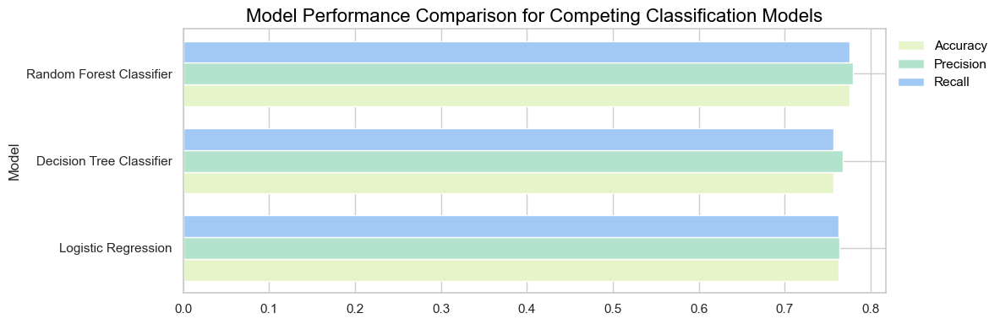

In [80]:
# Barplot with performance scores for each model

def plot_model_performance(models, X_train, y_train, X_test, y_test):
    model_names = list(models.keys())
    accuracies = []
    precisions = []
    recalls = []
    
    for model in models.values():
        metrics = evaluate_classification_model(model, X_train, y_train, X_test, y_test)
        accuracies.append(metrics['Test Accuracy'])
        precisions.append(metrics['Test Precision'])
        recalls.append(metrics['Test Recall'])
    
    index = np.arange(len(models))
    bar_width = 0.25

    f, ax = plt.subplots(figsize=(12, 4))  
    ax.barh(index, accuracies, bar_width, label='Accuracy', align='center', color=palette[4])
    ax.barh(index + bar_width, precisions, bar_width, label='Precision', align='center', color=palette[16])
    ax.barh(index + 2 * bar_width, recalls, bar_width, label='Recall', align='center')

    ax.set_ylabel('Model')
    ax.set_title('Model Performance Comparison for Competing Classification Models', fontsize=16)
    ax.set_yticks(index + bar_width)
    ax.set_yticklabels(model_names)
    ax.legend(bbox_to_anchor=(1.0, 1.0), frameon=False)
    plt.tight_layout()
    plt.show()

models = {
    'Logistic Regression': logistic_best,  
    'Decision Tree Classifier': dt_best,  
    'Random Forest Classifier': rfc_best  
}

plot_model_performance(models, X_train, y_train, X_test, y_test)

The following plot shows all three tuned classifier models' ROC curves as well as their AUCs together for comparison. 

- Of the three models, the logistic regression has a slightly higher AUC than the random forest model, and both are slightly higher than the decision tree model. 

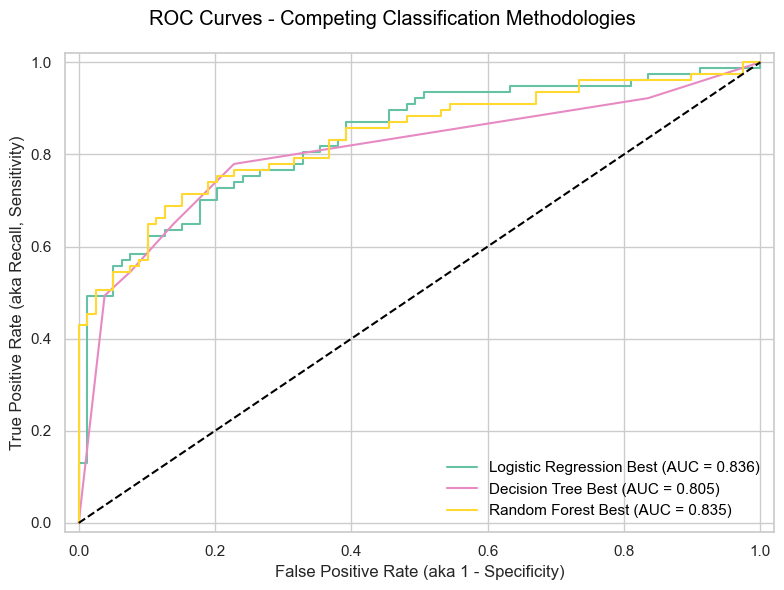

In [81]:
# Single plot with ROC curves for each model

from sklearn.metrics import roc_curve, roc_auc_score
palette = sns.color_palette('Set2', 6)

def plot_roc_curve(model, X_test, y_test, model_name, color):
    proba = model.predict_proba(X_test)[:, 1]  # Get model probabilities
    fpr, tpr, _ = roc_curve(y_test, proba) # Calculate ROC curve points
    auc = roc_auc_score(y_test, proba) # Calculate AUC score
    plt.plot(fpr, tpr, color=color, label=f'{model_name} (AUC = {auc:.3f})')  # Plot the ROC curve

plt.figure(figsize=(8, 6))
plt.suptitle('ROC Curves - Competing Classification Methodologies')

plot_roc_curve(logistic_best, X_test, y_test, 'Logistic Regression Best', palette[0]) 
plot_roc_curve(dt_best, X_test, y_test, 'Decision Tree Best', palette[3])
plot_roc_curve(rfc_best, X_test, y_test, 'Random Forest Best', palette[5])

plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate (aka 1 - Specificity)') 
plt.ylabel('True Positive Rate (aka Recall, Sensitivity)')  
plt.legend(loc="lower right", frameon=False)
plt.tight_layout()
plt.show()

Below, the exact breakdown of the classification models are shown. 

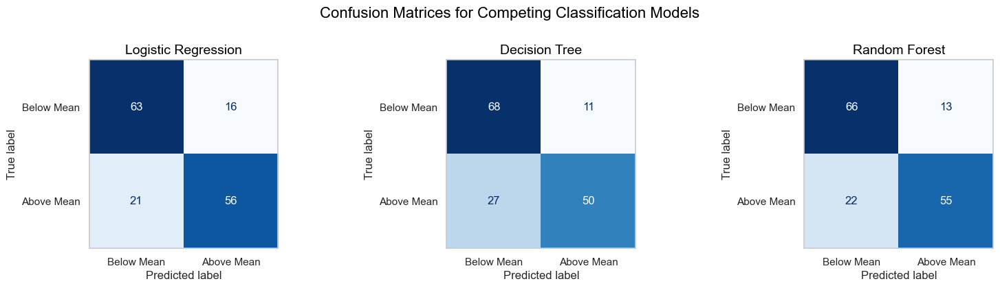

In [82]:
# Confusion matrices for each model

fig, ax = plt.subplots(1, 3, figsize=(16, 4))
train_confmat = ConfusionMatrixDisplay.from_estimator(logistic_best, X_test, y_test, cmap="Blues",
                                                      display_labels=['Below Mean', 'Above Mean'],
                                                      values_format='d', colorbar=False, ax=ax[0])
ax[0].set_title(f"Logistic Regression", fontsize=14)
ax[0].grid(False)

test_confmat = ConfusionMatrixDisplay.from_estimator(dt_best, X_test, y_test, cmap="Blues",
                                                     display_labels=['Below Mean', 'Above Mean'],
                                                     values_format='d', colorbar=False, ax=ax[1])
ax[1].set_title(f"Decision Tree", fontsize=14)
ax[1].grid(False)

test_confmat = ConfusionMatrixDisplay.from_estimator(rfc_best, X_test, y_test, cmap="Blues",
                                                     display_labels=['Below Mean', 'Above Mean'],
                                                     values_format='d', colorbar=False, ax=ax[2])
ax[2].set_title(f"Random Forest", fontsize=14)
ax[2].grid(False)

plt.suptitle("Confusion Matrices for Competing Classification Models", fontsize=16, x=0.5, y=1.03)
plt.tight_layout(pad=0.7)
plt.show()

TPs:   
LR: 56 / DT: 50 / RF: 55     
- College is predicted to have above-average grad rate; and actually has above-average grad rate.  
True positive rate (TPR) aka recall: rate at which the model captures actually-above-average grad rate colleges   

FPs (actual negatives):   
LR: 16 / DT: 11 / RF: 13  
- College is predicted to have above-average grad rate; but actually has below-average grad rate.   
False positive rate (FPR): the rate at which the model incorrectly predicts below-average grad rate colleges to be above-average grad rate colleges      

FNs (actual positives):   
LR: 21 / DT: 27 / RF: 22    
- College is predicted to have below-average grad rate; but actually has above-average grad rate.  
False negative rate (FNR): the rate at which the model incorrectly predicts above-average grad rate colleges to be below-average grad rate colleges    

TNs:   
LR: 63 / DT: 68 / RF: 66     
- College is predicted to have below-average grad rate; and actually has below-average grad rate. 
True negative rate (TNR)/also known as specificity: the rate at which the model captures actually-below-average grad rate colleges    



In [83]:
# Identify the three classification models' common important predictors

# Use coefficient magnitudes for log reg because its features importances are indicated by coefficient magnitudes
lr_importances = pd.Series(abs(logistic_best.coef_[0]), index=X_test.columns).sort_values(ascending=False)

# Get impurity-based importances for tree-based models
rfc_importances = pd.Series(rfc_best.feature_importances_, index=X_test.columns).sort_values(ascending=False)
dt_importances = pd.Series(dt_best.feature_importances_, index=X_test.columns).sort_values(ascending=False)

# use modified version of scikit learn function to get the permutation importance of each
def get_permutation_importance(clf, X, y):
    result = permutation_importance(clf, X, y, n_repeats=10, random_state=21, n_jobs=2)
    return pd.Series(result.importances_mean, index=X.columns).sort_values(ascending=False)

# Get permutation importance for each model
lr_perm_importances = get_permutation_importance(logistic_best, X_test, y_test)  # swap with lr
dt_perm_importances = get_permutation_importance(dt_best, X_test, y_test)
rfc_perm_importances = get_permutation_importance(rfc_best, X_test, y_test)

# identify top 10 impurity-based features for each model
top10_lr_imp = set(lr_importances.nlargest(10).index)  
top10_dt_imp = set(dt_importances.nlargest(10).index)
top10_rfc_imp = set(rfc_importances.nlargest(10).index)

# identify top 10 permutation-based features for each model
top10_lr_perm = set(lr_perm_importances.nlargest(10).index)
top10_dt_perm = set(dt_perm_importances.nlargest(10).index)
top10_rfc_perm = set(rfc_perm_importances.nlargest(10).index)

# Get the set of 10 common predictors among all models for each approach
common_imp_top10 = top10_rfc_imp.intersection(top10_lr_imp, top10_dt_imp)  # for coefficient and impurity-based importances
common_perm_top10 = top10_rfc_perm.intersection(top10_lr_perm, top10_dt_perm) # for permutation-based importances
common_all = common_imp_top10.intersection(common_perm_top10) # for permutation-based importances

print("Features common to each model's top 10 by coefficient-based and impurity-based methods:", common_imp_top10)
print("Features common to each model's top 10 by permutation-based method:", common_perm_top10)
print("Common to both methods:", common_perm_top10)

Features common to each model's top 10 by coefficient-based and impurity-based methods: {'Outstate', 'Apps', 'Top10perc', 'perc.alumni'}
Features common to each model's top 10 by permutation-based method: {'Outstate', 'Apps', 'Top10perc', 'perc.alumni'}
Common to both methods: {'Outstate', 'Apps', 'Top10perc', 'perc.alumni'}


As an experiment, let's try to put everything together on one plot. Each feature's importance for this will be its average across the different models and importance measures. 

In [152]:
# Check that the values are in similar ranges to each other

print(lr_importances.describe())
print(dt_importances.describe())
print(rfc_importances.describe())

print(lr_perm_importances.describe())
print(dt_perm_importances.describe())
print(rfc_perm_importances.describe())

count   18.000
mean     0.134
std      0.078
min      0.034
25%      0.080
50%      0.132
75%      0.162
max      0.301
dtype: float64
count   18.000
mean     0.056
std      0.140
min      0.000
25%      0.000
50%      0.000
75%      0.051
max      0.580
dtype: float64
count   18.000
mean     0.056
std      0.131
min      0.000
25%      0.006
50%      0.022
75%      0.033
max      0.569
dtype: float64
count   18.000
mean     0.011
std      0.011
min     -0.008
25%      0.004
50%      0.009
75%      0.017
max      0.033
dtype: float64
count   18.000
mean     0.012
std      0.037
min     -0.005
25%      0.000
50%      0.000
75%      0.000
max      0.153
dtype: float64
count   18.000
mean     0.013
std      0.040
min     -0.004
25%      0.000
50%      0.004
75%      0.006
max      0.174
dtype: float64


In [150]:
# Put importances together in df

importances_df = pd.DataFrame({
    'Logistic Regression (coefficient-based)': lr_importances,
    'Logistic Regression': lr_perm_importances,
    'Decision Tree (impurity-based)': dt_importances,
    'Decision Tree': dt_perm_importances,
    'Random Forest (impurity-based)': rfc_importances,
    'Random Forest': rfc_perm_importances
})

# Calculate mean importance for each feature across the models
average_importances = importances_df.mean(axis=1).sort_values(ascending=False)
average_importances_df = pd.DataFrame(average_importances).reset_index()
average_importances_df.columns = ['feature', 'average_importance']
average_importances_df

,feature,average_importance
0,Outstate,0.300
1,perc.alumni,0.117
2,Top10perc,0.051
3,Room.Board,0.044
4,Top25perc,0.040
5,PhD,0.039
6,Apps,0.035
7,Enroll,0.032
8,Personal,0.030
9,Accept,0.028


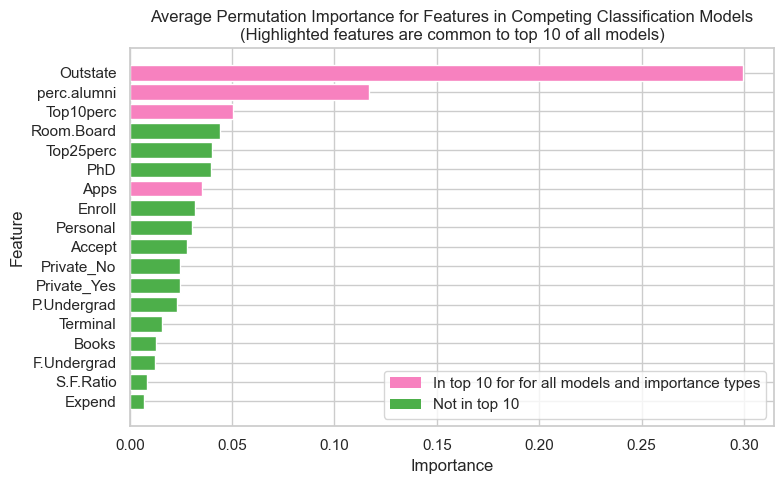

In [151]:
# Compile feature importance info into a single plot

# Highlight the features that are in the top-10 among all models and importance measures
average_importances_df = average_importances_df.sort_values(by='average_importance') # sort this way to plot correctly
plt.figure(figsize=(8, 5))
for i, row in average_importances_df.iterrows():
    color = palette[7] if row['feature'] in common_perm_top10 else palette[2]
    plt.barh(row['feature'], row['average_importance'], color=color)

# Create custom legend
top_bar = plt.Rectangle((0,0),1,1,fc=palette[7], edgecolor = 'none')
rest_bar = plt.Rectangle((0,0),1,1,fc=palette[2], edgecolor = 'none')
plt.legend([top_bar, rest_bar], ['In top 10 for for all models and importance types', 'Not in top 10'], loc='lower right')

plt.title('Average Importance for Features in Competing Classification Models\n(Highlighted features are common to top 10 of all models)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

# Prediction of Graduation Rate with Regression Models

Now, we will implement three regression models with the goal of predicting these same colleges' graduation rates. The models we will use include Lasso regression, Ridge regression, and Random Forest regression. After, we will compare their performances.  

First, we must prepare the data for the regression task by restoring the target variable, Grad.Rate, in its original, continuous form. Then, we re-split and re-scale the data. 

### Restore "Grad.Rate" column and resplit data:

In [84]:
df["Grad.Rate"] = savedGradRate

In [85]:
df.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0,1
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0,1
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0,1
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,0,1
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0,1


In [86]:
X = df.drop('Grad.Rate', axis = 1) #keep features only for X
y = df['Grad.Rate'] #keep target variable only for y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [87]:
y.head()

0    60
1    56
2    54
3    59
4    15
Name: Grad.Rate, dtype: int64

In [88]:
sc = StandardScaler()

In [89]:
sc.fit(X_train)

#transform the train data
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)

#transform the test data
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

In [90]:
# Replacing with scaled test/train predictors 
X_train = X_train_sc
X_test = X_test_sc

In [91]:
y_train = y_train.reset_index(drop=True) 
X_train = X_train.reset_index(drop=True)

### Lasso Regression: 

In [92]:
# Initialize and fit the baseline lasso model

lasso_base = Lasso(fit_intercept=True, max_iter=5000)
lasso_base.fit(X_train, y_train)

Lasso(max_iter=5000)

In [93]:
# Define function for evaluating regression models

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def print_regression_metrics_and_diff(model, X_train, y_train, X_test, y_test):
    datasets = [('Train', X_train, y_train), ('Test', X_test, y_test)]
    metrics_list = ['MAE', 'MSE', 'RMSE', 'R-squared']
    metrics_functions = {
        'MAE': mean_absolute_error,
        'MSE': mean_squared_error,
        'RMSE': lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)),
        'R-squared': r2_score
    }
    results = {'Train': {}, 'Test': {}}

    print(f"Metrics for {model}:")
    
    for name, X, y in datasets:
        y_pred = model.predict(X)
        for metric in metrics_list:
            score = metrics_functions[metric](y, y_pred)
            results[name][metric] = score
    
    print(f"\n{'Metric':<12} {'Train':<10} {'Test':<10}")
    print("-" * 32)
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        print(f"{metric:<12} {train_score:.4f}       {test_score:.4f}")
    
    print("\nDifferences (Train - Test):")
    for metric in metrics_list:
        train_score = results['Train'].get(metric, 0)
        test_score = results['Test'].get(metric, 0)
        diff = train_score - test_score
        direction = "increased" if diff < 0 else "decreased"
        print(f"{metric} {direction} by {abs(diff):.4f}")

# print_regression_metrics_and_diff(model, X_train, y_train, X_test, y_test)

In [94]:
print_regression_metrics_and_diff(lasso_base, X_train, y_train, X_test, y_test)

Metrics for Lasso(max_iter=5000):

Metric       Train      Test      
--------------------------------
MAE          10.2212       7.9838
MSE          180.4092       111.7395
RMSE         13.4316       10.5707
R-squared    0.4171       0.5249

Differences (Train - Test):
MAE decreased by 2.2374
MSE decreased by 68.6697
RMSE decreased by 2.8610
R-squared increased by 0.1078


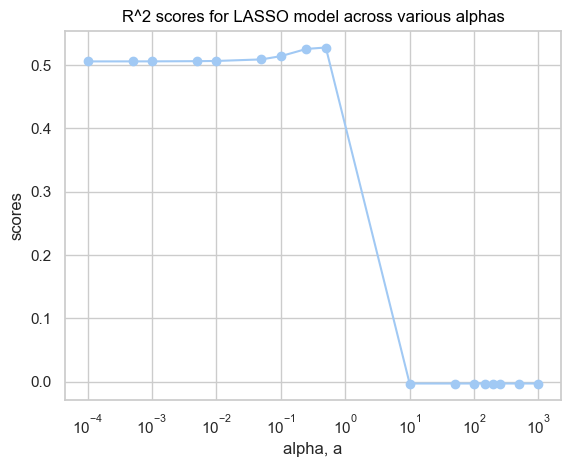

In [95]:
#Inspect which best lambda/alpha value range to use before grid search:
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 10, 50, 100, 150, 200, 250, 500, 1000]
scores = []

for a in alphas:
    lasso = Lasso(alpha = a, fit_intercept=True)
    lasso.fit(X_train, y_train)
    scores.append(lasso.score(X_test, y_test))


plt.plot(alphas, scores, '-o')
plt.title("R^2 scores for LASSO model across various alphas")
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.xscale('log')
plt.show()

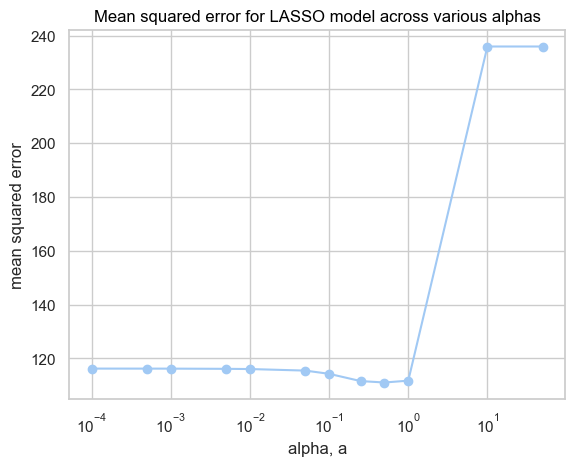

In [96]:
#Inspect which best lambda/alpha value range to use before grid search:
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 1, 10, 50]
scores = []

for a in alphas:
    lasso = Lasso(alpha = a, fit_intercept=True)
    lasso.fit(X_train, y_train)
    pred_test=lasso.predict(X_test)
    scores.append(mean_squared_error(y_test, pred_test))


plt.plot(alphas, scores, '-o')
plt.title("Mean squared error for LASSO model across various alphas")
plt.xlabel('alpha, a')
plt.ylabel('mean squared error')
plt.xticks(alphas)
plt.xscale('log')
plt.show()

Judging from the plots, it seems R^2 is maximized and MSE is minimized at small alpha values, ~0.001 to 1. We will set the grid search up for a conservative range including this region.  

Now the grid search will be implemented for obtaining the best model parameters. 

In [129]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso

# First use grid search to find the best lambda

# define model
model = Lasso(fit_intercept=True, max_iter=5000)

# define model evaluation method
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 21)
# define grid
grid = dict()
grid['alpha'] = np.linspace(0.000001, 10, 1000)  # Generates 1000 evenly spaced values from 0.0001 to 1
# define search
search = GridSearchCV(model, grid, scoring = 'neg_mean_squared_error', cv = cv, verbose=1)
# perform the search
results = search.fit(X_train, y_train)
# Print the best parameter
bestAlpha =results.best_params_['alpha']
print("best alpha =", bestAlpha)

Fitting 15 folds for each of 1000 candidates, totalling 15000 fits
best alpha = 0.31031127927927926


In [131]:
results.best_params_

{'alpha': 0.31031127927927926}

In [132]:
# Next make the model using the lambda printed above
model_lasso = Lasso(alpha=bestAlpha, fit_intercept=True, max_iter=5000)
model_lasso.fit(X_train, y_train)
model_lasso                                                                                                                                                 

Lasso(alpha=0.31031127927927926, max_iter=5000)

In [133]:
# Now we take our model and run it against the test data
y_hat_test = model_lasso.predict(X_test)

#Lets calculate the MSE and RMSE for our test data
test_mse = mean_squared_error(y_test, y_hat_test)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test, y_hat_test)
test_r_squared = r2_score(y_test, y_hat_test)
test_mape = mean_absolute_percentage_error(y_test, y_hat_test)
scores_lasso = {
    "RMSE" : test_rmse,
    "MAPE" : test_mape,
    "R2"   : test_r_squared
}

print(f'The test RMSE is: {test_rmse}')
print(f'The test MAPE is: {test_mape}')
print(f'The test Rsquared is: {test_r_squared}')

The test RMSE is: 10.53642897920786
The test MAPE is: 0.140665583842752
The test Rsquared is: 0.527997031392391


In [101]:
# Re-print model metrics for baseline LASSO for reference

print_regression_metrics_and_diff(lasso_base, X_train, y_train, X_test, y_test)

Metrics for Lasso(max_iter=5000):

Metric       Train      Test      
--------------------------------
MAE          10.2212       7.9838
MSE          180.4092       111.7395
RMSE         13.4316       10.5707
R-squared    0.4171       0.5249

Differences (Train - Test):
MAE decreased by 2.2374
MSE decreased by 68.6697
RMSE decreased by 2.8610
R-squared increased by 0.1078


In [102]:
# Print model metrics for tuned LASSO

print_regression_metrics_and_diff(model_lasso, X_train, y_train, X_test, y_test)

Metrics for Lasso(alpha=0.31031127927927926, max_iter=5000):

Metric       Train      Test      
--------------------------------
MAE          9.8950       8.0072
MSE          173.6694       111.0163
RMSE         13.1784       10.5364
R-squared    0.4389       0.5280

Differences (Train - Test):
MAE decreased by 1.8877
MSE decreased by 62.6531
RMSE decreased by 2.6419
R-squared increased by 0.0891


In [103]:
model_lasso.coef_

array([ 2.70398022,  0.        , -0.        ,  0.54714791,  2.79231508,
       -0.14722905, -2.29238718,  3.48631744,  1.74585727, -0.36847559,
       -1.05222856,  0.25247643, -0.        ,  0.        ,  3.39787066,
       -0.98740008, -1.31890405,  0.        ])

In [104]:
# To identify the variables with the non zero regression coefficients, make a dataframe with the variables and their coefficients
names = X_train.columns
lasso_coef = model_lasso.coef_
df_lasso = pd.DataFrame([lasso_coef])
df_lasso = pd.DataFrame(lasso_coef)
names = pd.DataFrame(list(X_train.columns))
df_lasso  = pd.concat([names, df_lasso], axis = 1)
df_lasso.columns = ['Feature', 'lasso_coeff']
df_lasso  = df_lasso.sort_values(by='lasso_coeff', ascending = False)
df_lasso

,Feature,lasso_coeff
7,Outstate,3.486317
14,perc.alumni,3.397871
4,Top25perc,2.792315
0,Apps,2.703980
8,Room.Board,1.745857
3,Top10perc,0.547148
11,PhD,0.252476
13,S.F.Ratio,0.000000
12,Terminal,-0.000000
17,Private_Yes,0.000000


,index,Actual Graduation Rate,Predicted Graduation Rate,rfr_resid
0,568,66,57.297657,8.702343
1,530,45,49.461986,-4.461986
2,610,54,56.659495,-2.659495


Text(0.5, 1.0, 'Actual vs Predicted Graduation Rate: LASSO Regression')

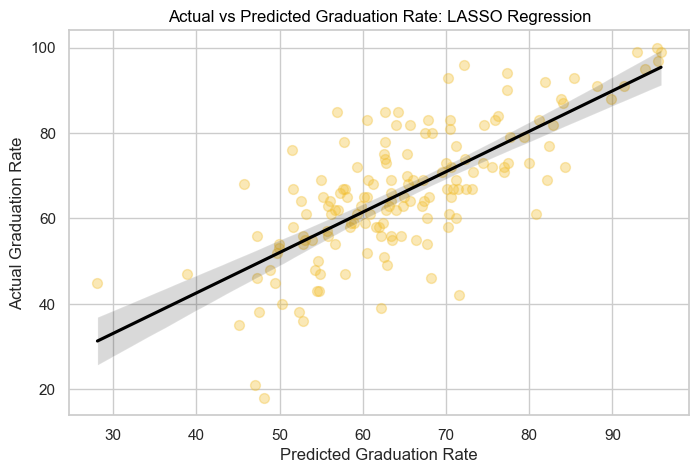

In [105]:
# Produce the plot of residuals vs predicted values for the RF regression

lasso_pred = model_lasso.predict(X_test)

# Create residual dataframe
lasso_y_residuals = pd.DataFrame(y_test.reset_index())
df_lasso_pred = pd.DataFrame(lasso_pred)
lasso_y_residuals = pd.concat([lasso_y_residuals, df_lasso_pred], axis = 1)
lasso_y_residuals = lasso_y_residuals.rename(columns = {0:'lasso_pred'})
lasso_y_residuals['rfr_resid'] = lasso_y_residuals['Grad.Rate'] - lasso_y_residuals['lasso_pred']
lasso_y_residuals.rename(columns={'Grad.Rate': 'Actual Graduation Rate', 'lasso_pred': 'Predicted Graduation Rate'}, inplace=True)
display(lasso_y_residuals.head(3))

plt.figure(figsize=(8,5)) 
sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data=lasso_y_residuals,
            scatter_kws={"color":"#f2be2e", "alpha":0.35, "s":50}, line_kws={'color': 'black'});
plt.title("Actual vs Predicted Graduation Rate: LASSO Regression")

### Ridge Regression:

iteration 0.0001 done
iteration 0.0005 done
iteration 0.001 done
iteration 0.005 done
iteration 0.01 done
iteration 0.05 done
iteration 0.1 done
iteration 0.25 done
iteration 0.5 done
iteration 10 done
iteration 50 done
iteration 100 done
iteration 150 done
iteration 200 done
iteration 250 done
iteration 500 done


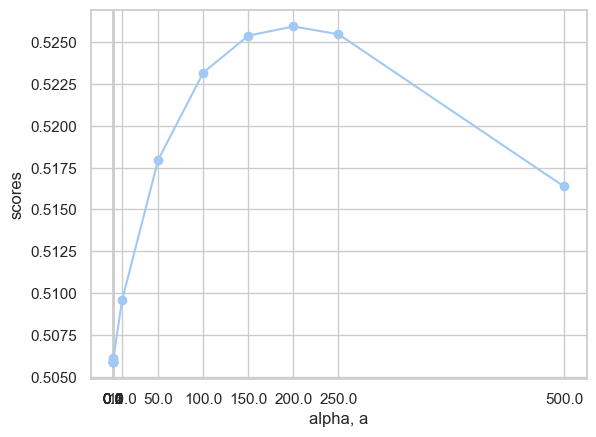

In [106]:
# Inspect which best lambda/alpha value range to use before grid search:
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 10, 50, 100, 150, 200, 250, 500]
scores = []

for a in alphas:
    ridge = Ridge(alpha = a, fit_intercept=True)
    ridge.fit(X_train, y_train)
    scores.append(ridge.score(X_test, y_test))
    print("iteration {} done".format(a))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.show()

iteration 10 done
iteration 50 done
iteration 100 done
iteration 125 done
iteration 150 done
iteration 175 done
iteration 200 done
iteration 225 done
iteration 250 done
iteration 275 done
iteration 500 done


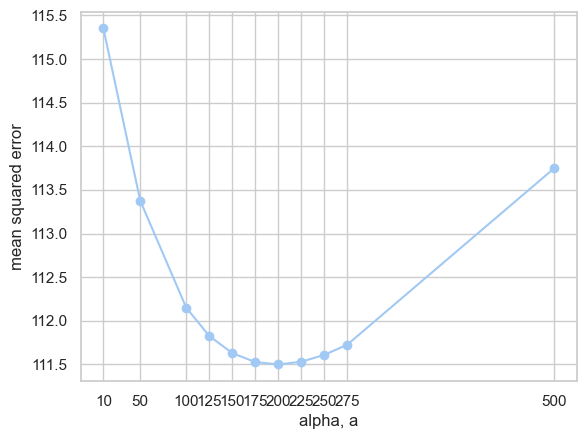

In [107]:
# On inspection: lambda range around 150 in alpha value.
alphas = [10, 50, 100, 125, 150, 175, 200, 225, 250, 275, 500]
scores = []

for a in alphas:
    ridge = Ridge(alpha = a, fit_intercept=True)
    ridge.fit(X_train, y_train)
    pred_test=ridge.predict(X_test)
    scores.append(mean_squared_error(y_test, pred_test))
    print("iteration {} done".format(a))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('mean squared error')
plt.xticks(alphas)
plt.show()

In [108]:
# Similar result in lower mean square error, thus grid search would focus alpha values of 50-250 for optimal lambda value
ridge_model = Ridge(fit_intercept=True, max_iter=5000)

# Define model evaluation method (K = 5, repeats = 5)
cv = RepeatedKFold(n_splits = 5, n_repeats = 5, random_state = 42)

# Defining grid
grid = dict()
grid['alpha'] = arange(50, 250, 1)

# Defining search (scoring = 'neg_mean_squared_error')
search = GridSearchCV(ridge_model, grid, scoring = 'neg_mean_squared_error', cv = cv, n_jobs=-1)
# Perform the search with testing data
result = search.fit(X_train, y_train)

In [109]:
print('Config: %s' % result.best_params_)

Config: {'alpha': 92}


In [110]:
ridge = Ridge(alpha = 92, fit_intercept=True)
ridge.fit(X_train, y_train)

# Create a dataframe with the coefficients
names = X.columns
ridge_coef = ridge.coef_
df_ridge = pd.DataFrame([ridge_coef])

df_ridge.columns = names
df_ridge = df_ridge.T
df_ridge=df_ridge.rename(columns = {0:'corr_ridge_coeff'})# corr_ridge_coeff is corresponding ridge coefficients of the variable
pd.options.display.float_format = '{:.3f}'.format
df_ridge

,corr_ridge_coeff
Apps,2.381
Accept,0.917
Enroll,0.018
Top10perc,1.486
Top25perc,2.263
F.Undergrad,-0.967
P.Undergrad,-2.070
Outstate,2.883
Room.Board,1.910
Books,-0.536


In [111]:
# Ridge prediction using X_test and y_test

ridge_pred = ridge.predict(X_test)
y_hat_test = ridge_pred

# Predict: RMSE
test_mse = mean_squared_error(y_test, y_hat_test)
test_rmse = np.sqrt(test_mse)

# Predict: R^2
test_r_squared = r2_score(y_test, y_hat_test)

# Predict: MAPE
test_mape = mean_absolute_percentage_error(y_test, y_hat_test)

print(f'Test RMSE is:\t{round(test_rmse, 3)}')
print(f'Test R^2 is:\t{round(test_r_squared, 3)}')
print(f'Test MAPE is:\t{round(test_mape, 3)}')

Test RMSE is:	10.597
Test R^2 is:	0.523
Test MAPE is:	0.143


In [112]:
df_ridge['Variable_Names'] = df_ridge.index
# Print equation
print(f"Graduation Rate = {ridge.intercept_:.2f} + ", end="")
for x in range (0, len(df_ridge['Variable_Names'])):
    print(f"({df_ridge['Variable_Names'][x]} * {df_ridge['corr_ridge_coeff'][x]:.2f})", end="")
    if (x + 1) < len(df_ridge['Variable_Names']):
        print(" + ", end="")

Graduation Rate = 65.29 + (Apps * 2.38) + (Accept * 0.92) + (Enroll * 0.02) + (Top10perc * 1.49) + (Top25perc * 2.26) + (F.Undergrad * -0.97) + (P.Undergrad * -2.07) + (Outstate * 2.88) + (Room.Board * 1.91) + (Books * -0.54) + (Personal * -1.17) + (PhD * 1.13) + (Terminal * -0.60) + (S.F.Ratio * 0.05) + (perc.alumni * 3.17) + (Expend * -1.25) + (Private_No * -0.88) + (Private_Yes * 0.88)

In [113]:
# Create residual dataframe
ridge_y_residuals = pd.DataFrame(y_test.reset_index())
df_ridge_pred = pd.DataFrame(ridge_pred)
ridge_y_residuals = pd.concat([ridge_y_residuals, df_ridge_pred], axis = 1)
ridge_y_residuals = ridge_y_residuals.rename(columns = {0:'ridge_pred'})
ridge_y_residuals['ridge_resid'] = ridge_y_residuals['Grad.Rate'] - ridge_y_residuals['ridge_pred']
ridge_y_residuals.head()

,index,Grad.Rate,ridge_pred,ridge_resid
0,568,66,56.961,9.039
1,530,45,49.848,-4.848
2,610,54,56.216,-2.216
3,109,73,70.120,2.880
4,586,43,55.554,-12.554


In [114]:
# Rename columns
ridge_y_residuals.rename(columns={'Grad.Rate': 'Actual Graduation Rate', 'ridge_pred': 'Predicted Graduation Rate'}, inplace=True)
ridge_y_residuals.head()

,index,Actual Graduation Rate,Predicted Graduation Rate,ridge_resid
0,568,66,56.961,9.039
1,530,45,49.848,-4.848
2,610,54,56.216,-2.216
3,109,73,70.120,2.880
4,586,43,55.554,-12.554


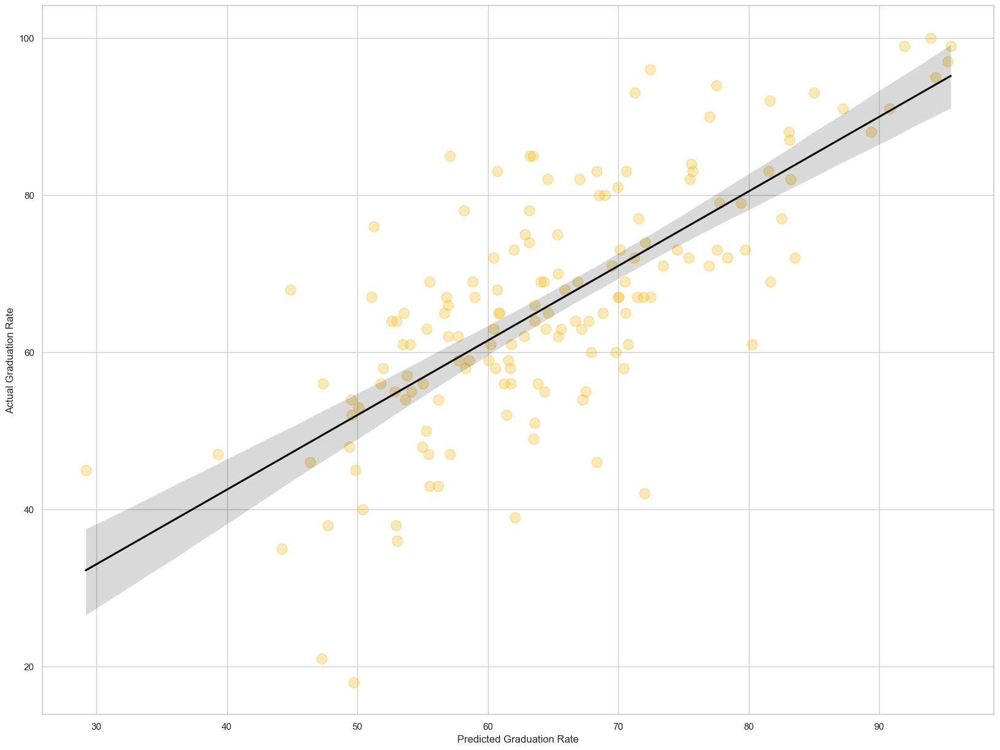

In [115]:
sns.set(style='whitegrid')
plt.figure(figsize=(20,15)) # changes area of scatterplot
# Plot residuals
sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data = ridge_y_residuals,
            scatter_kws={"color":"#f2be2e","alpha":0.35,"s":150}, line_kws={'color': 'black'});

RMSE: 10.597 \
    The RMSE is the square root of the variance of the residuals: can be interpreted as the standard deviation of the unexplained variance.
    
$R^2$: 52.3% \
    $R^2$ score represents the proportion of variance (of y) that has been explained by the independent variables in the model. It provide a measure for how well unseen samples are likely to be predicted by the model. The $R^2$ score of this model is very poor.
    
MAPE: 0.143 \
    Mean absolute percentage error (MAPE) is the average of the absolute percentage errors of forecast (MAPE measures how far off predictions are on average)

# Random Forest Regression

In [116]:
# Initialize and fit the baseline RFR model

from sklearn.ensemble import RandomForestRegressor

rfr_base = RandomForestRegressor(n_estimators=100, random_state=21)
rfr_base.fit(X_train, y_train)

RandomForestRegressor(random_state=21)

Here are the baseline performance metrics for the random forest regression model. These can be compared against the tuned metrics. 

In [117]:
# Ridge prediction using X_test and y_test

rfr_base_pred = rfr_base.predict(X_test)
y_hat_test = rfr_base_pred

# Predict: RMSE
test_mse = mean_squared_error(y_test, y_hat_test)
test_rmse = np.sqrt(test_mse)

# Predict: R^2
test_r_squared = r2_score(y_test, y_hat_test)

# Predict: MAPE
test_mape = mean_absolute_percentage_error(y_test, y_hat_test)

print(f'Test RMSE is:\t{test_rmse}')
print(f'Test R^2 is:\t{round(test_r_squared, 3)}')
print(f'Test MAPE is:\t{round(test_mape, 2)}')

Test RMSE is:	10.61728437803672
Test R^2 is:	0.521
Test MAPE is:	0.14


In [118]:
# Print the performance metrics for the baseline RFR model

print_regression_metrics_and_diff(rfr_base, X_train, y_train, X_test, y_test)

Metrics for RandomForestRegressor(random_state=21):

Metric       Train      Test      
--------------------------------
MAE          3.8114       8.2425
MSE          27.0130       112.7267
RMSE         5.1974       10.6173
R-squared    0.9127       0.5207

Differences (Train - Test):
MAE increased by 4.4311
MSE increased by 85.7137
RMSE increased by 5.4199
R-squared decreased by 0.3920


The random forest regression model is tuned with a very similar protocol as the random forest classification model, only with a different set of parameters that is appropriate for the regression task. (e.g. the 'criterion' set is swapped for MSE and MAE)   

In [119]:
# Un-comment the following command if you wish to avoid the lengthy grid searches
# (Final random forest model is already initialized with parameters below)

# import sys
# # Stop the execution of the notebook
# sys.exit("Stopping the notebook execution intentionally at this cell.")

SystemExit: Stopping the notebook execution intentionally at this cell.

/Users/mollyscally/anaconda3/envs/data3550/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
# Randomized search of wide param grid

from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    "n_estimators": range(100, 2001, 100),              # Number of trees
    'max_depth': [None, 5, 10, 20, 30, 50],             # Maximum depth of each tree
    "min_samples_split": range(2, 15),                  # Minimum number of samples required to split an internal node
    "min_samples_leaf": range(1, 11),                   # Minimum number of samples required at each leaf node
    "max_features": [None, 'sqrt', 'log2'],             # Number of features to consider for the best split
    "bootstrap": [True, False],                         # Whether bootstrap samples are used
    "max_leaf_nodes": [None, 50, 100, 150],             # Maximum number of leaf nodes
    "min_impurity_decrease": [0.0, 0.01, 0.1],          # A node will split if this split induces a decrease of the impurity greater than this value
    'criterion': ['squared_error', 'absolute_error']    # Criteria for measuring the quality of a split
}

rfr = RandomForestRegressor(random_state=21)  # Initialize the random forest model

# Setup RandomizedSearchCV
rfr_random_search = RandomizedSearchCV(rfr, param_distributions=param_dist, n_iter=100, scoring='neg_mean_squared_error', cv=5, verbose=1, random_state=21, n_jobs=-1)

# Fit RandomizedSearchCV
rfr_random_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=21),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['squared_error',
                                                      'absolute_error'],
                                        'max_depth': [None, 5, 10, 20, 30, 50],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'max_leaf_nodes': [None, 50, 100, 150],
                                        'min_impurity_decrease': [0.0, 0.01,
                                                                  0.1],
                                        'min_samples_leaf': range(1, 11),
                                        'min_samples_split': range(2, 15),
                                        'n_estimators': range(100, 2001, 100)},
                   random_state=21, scoring='neg_mean_squared_error',
                   verbose=1)

The best parameters and performance metrics for the randomized search are shown:  

In [ ]:
# Get parameters from randomized search

print("Best parameters from RandomizedSearchCV:")
rfr_best_params = rfr_random_search.best_params_
rfr_best_params

{'n_estimators': 900,
 'min_samples_split': 9,
 'min_samples_leaf': 8,
 'min_impurity_decrease': 0.01,
 'max_leaf_nodes': None,
 'max_features': 'sqrt',
 'max_depth': 50,
 'criterion': 'absolute_error',
 'bootstrap': True}

In [ ]:
# Get metrics for randomized search

print_regression_metrics_and_diff(rfr_random_search, X_train, y_train, X_test, y_test)

Metrics for RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=21),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['squared_error',
                                                      'absolute_error'],
                                        'max_depth': [None, 5, 10, 20, 30, 50],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'max_leaf_nodes': [None, 50, 100, 150],
                                        'min_impurity_decrease': [0.0, 0.01,
                                                                  0.1],
                                        'min_samples_leaf': range(1, 11),
                                        'min_samples_split': range(2, 15),
                                        'n_estimators': range(100, 2001, 100)},
                   random_state=21, scori

After the randomized search, the grid search will now take the found set of parameters and search around this grid to obtain the ideal set of parameters to maximize the multiple scoring metrics. 

In [ ]:
# Extract best parameters from randomized search and conduct search of narrower grid

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error, r2_score

# Scoring metrics for regression
scoring = {
    'neg_mean_squared_error': 'neg_mean_squared_error',
    'neg_mean_absolute_error': 'neg_mean_absolute_error',
    'r2': 'r2'
}

narrow_grid = {
    "n_estimators": [max(100, rfr_best_params['n_estimators'] - 50), rfr_best_params['n_estimators'], rfr_best_params['n_estimators'] + 50],
    "max_depth": [None if rfr_best_params['max_depth'] is None else max(5, rfr_best_params['max_depth'] - 5), rfr_best_params['max_depth'], None if rfr_best_params['max_depth'] is None else rfr_best_params['max_depth'] + 5],
    "min_samples_split": [max(2, rfr_best_params['min_samples_split'] - 1), rfr_best_params['min_samples_split'], rfr_best_params['min_samples_split'] + 1],
    "min_samples_leaf": [max(1, rfr_best_params['min_samples_leaf'] - 1), rfr_best_params['min_samples_leaf'], rfr_best_params['min_samples_leaf'] + 1],
    "max_features": [rfr_best_params['max_features']],
    "bootstrap": [rfr_best_params['bootstrap']],
    "max_leaf_nodes": [None if rfr_best_params['max_leaf_nodes'] is None else max(1, rfr_best_params['max_leaf_nodes']), rfr_best_params['max_leaf_nodes'], None if rfr_best_params['max_leaf_nodes'] is None else min(200, rfr_best_params['max_leaf_nodes'] + 50)],
    "min_impurity_decrease": [rfr_best_params['min_impurity_decrease']],
    "criterion": [rfr_best_params['criterion']]
}

# Setup GridSearchCV
rfr_focused_search = GridSearchCV(rfr, narrow_grid, scoring=scoring, cv=5, refit='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit GridSearchCV
rfr_focused_search.fit(X_train, y_train)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=21), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['absolute_error'],
                         'max_depth': [45, 50, 55], 'max_features': ['sqrt'],
                         'max_leaf_nodes': [None, None, None],
                         'min_impurity_decrease': [0.01],
                         'min_samples_leaf': [7, 8, 9],
                         'min_samples_split': [8, 9, 10],
                         'n_estimators': [850, 900, 950]},
             refit='neg_mean_squared_error',
             scoring={'neg_mean_absolute_error': 'neg_mean_absolute_error',
                      'neg_mean_squared_error': 'neg_mean_squared_error',
                      'r2': 'r2'},
             verbose=1)

In [ ]:
# Get metrics from grid search

print_regression_metrics_and_diff(rfr_focused_search, X_train, y_train, X_test, y_test)

Metrics for GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=21), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['absolute_error'],
                         'max_depth': [45, 50, 55], 'max_features': ['sqrt'],
                         'max_leaf_nodes': [None, None, None],
                         'min_impurity_decrease': [0.01],
                         'min_samples_leaf': [7, 8, 9],
                         'min_samples_split': [8, 9, 10],
                         'n_estimators': [850, 900, 950]},
             refit='neg_mean_squared_error',
             scoring={'neg_mean_absolute_error': 'neg_mean_absolute_error',
                      'neg_mean_squared_error': 'neg_mean_squared_error',
                      'r2': 'r2'},
             verbose=1):

Metric       Train      Test      
--------------------------------
MAE          8.0988       8.1412
MSE          129.2946       111.1737
RMSE         11.3708       10.5439
R-squared    0.5822       0.

In [ ]:
# Get parameters from grid search

print("Best parameters from GridSearchCV:")
rfr_best_params = rfr_focused_search.best_params_
rfr_best_params

Best parameters from GridSearchCV:


{'bootstrap': True,
 'criterion': 'absolute_error',
 'max_depth': 45,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.01,
 'min_samples_leaf': 8,
 'min_samples_split': 8,
 'n_estimators': 950}

Now the best RF regression model is initialized with the best found parameters, cross validation is performed, and the best model is fit.  

In [120]:
# Initialize best rfc model with the best params

# rfr_best = RandomForestRegressor(random_state=21, **rfr_best_params) # this version automatically transfer the best params into the model definition

rfr_best = RandomForestRegressor(random_state=21, criterion='absolute_error', max_depth=45, max_features='sqrt', 
                                 max_leaf_nodes=None, min_impurity_decrease=0.01, min_samples_leaf=8, min_samples_split=8, n_estimators=950) 

In [121]:
# Conduct the cross validation using the unfitted model

from sklearn.model_selection import RepeatedKFold, cross_validate
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error, r2_score

# Scoring metrics for regression
scoring = {
    'neg_mean_squared_error': 'neg_mean_squared_error',
    'neg_mean_absolute_error': 'neg_mean_absolute_error',
    'r2': 'r2'
}

# CV strategy
cv = RepeatedKFold(n_splits=10, n_repeats=5, random_state=21)

# Cross validate and obtain scores 
RfR_scores = cross_validate(rfr_best, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True, verbose=True, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   39.3s finished


In [122]:
# Fit the best model

rfr_best.fit(X_train, y_train)

RandomForestRegressor(criterion='absolute_error', max_depth=45,
                      max_features='sqrt', min_impurity_decrease=0.01,
                      min_samples_leaf=8, min_samples_split=8, n_estimators=950,
                      random_state=21)

The performance metrics for the best model are shown. Although the test-set values of the final model's absolute error, mean squared error and r-squared do not differ much from those of the initial model, there has been a great reduction in the difference between test and train performance. This indicates that the baseline model was likely overfitting on the training data, and the final model will be much more reliable in its predictions. The found parameters from the grid search must have had some role in finding an optimal tree structure to balance complexity and broadness in modeling the data's characteristics.  

In [123]:
# Get the metrics for the tuned RF regression model

print_regression_metrics_and_diff(rfr_best, X_train, y_train, X_test, y_test)

Metrics for RandomForestRegressor(criterion='absolute_error', max_depth=45,
                      max_features='sqrt', min_impurity_decrease=0.01,
                      min_samples_leaf=8, min_samples_split=8, n_estimators=950,
                      random_state=21):

Metric       Train      Test      
--------------------------------
MAE          8.0988       8.1412
MSE          129.2946       111.1737
RMSE         11.3708       10.5439
R-squared    0.5822       0.5273

Differences (Train - Test):
MAE increased by 0.0424
MSE decreased by 18.1209
RMSE decreased by 0.8269
R-squared decreased by 0.0549


Next a plot of residuals vs predicted values for the RF regression are shown: 

,index,Actual Graduation Rate,Predicted Graduation Rate,rfr_resid
0,568,66,54.470,11.530
1,530,45,52.970,-7.970
2,610,54,51.550,2.450


Text(0.5, 1.0, 'Actual vs Predicted Graduation Rate: Random Forest Regression')

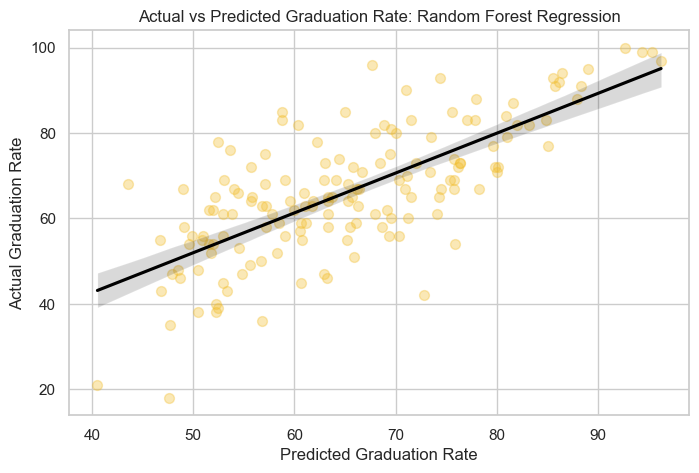

In [124]:
# Produce the plot of residuals vs predicted values for the RF regression

rfr_pred = rfr_best.predict(X_test)

# Create residual dataframe
rfr_y_residuals = pd.DataFrame(y_test.reset_index())
df_rfr_pred = pd.DataFrame(rfr_base_pred)
rfr_y_residuals = pd.concat([rfr_y_residuals, df_rfr_pred], axis = 1)
rfr_y_residuals = rfr_y_residuals.rename(columns = {0:'rfr_pred'})
rfr_y_residuals['rfr_resid'] = rfr_y_residuals['Grad.Rate'] - rfr_y_residuals['rfr_pred']
rfr_y_residuals.rename(columns={'Grad.Rate': 'Actual Graduation Rate', 'rfr_pred': 'Predicted Graduation Rate'}, inplace=True)
display(rfr_y_residuals.head(3))

plt.figure(figsize=(8,5)) 
sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data=rfr_y_residuals,
            scatter_kws={"color":"#f2be2e", "alpha":0.35, "s":50}, line_kws={'color': 'black'});
plt.title("Actual vs Predicted Graduation Rate: Random Forest Regression")

The predictors for the random forest regression model can be assessed and compared through their feature importances, because unlike the other two linear models, it lacks a traditional equation with coefficients for which to judge each predictor's contribution to the response. Same as the classifier RF model, two methods of feature importances are shown below for a thorough assessment.  

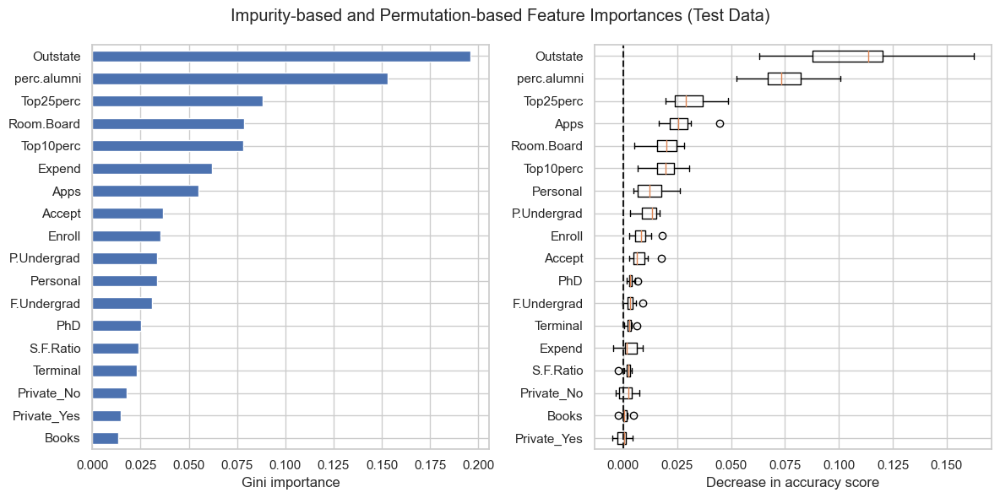

In [125]:
# Feature importance: side-by-side plot for impurity vs permutation

mdi_importances = pd.Series(rfr_best.feature_importances_, index=X_test.columns)
tree_importance_sorted_idx = np.argsort(rfr_best.feature_importances_)
tree_indices = np.arange(0, len(rfr_best.feature_importances_)) + 0.5

from sklearn.inspection import permutation_importance

def plot_permutation_importance(clf, X, y, ax):
    result = permutation_importance(clf, X, y, n_repeats=10, random_state=42, n_jobs=2)
    perm_sorted_idx = result.importances_mean.argsort()

    ax.boxplot(
        result.importances[perm_sorted_idx].T,
        vert=False,
        labels=X.columns[perm_sorted_idx],
    )
    ax.axvline(x=0, color="k", linestyle="--")
    return ax

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
mdi_importances.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(rfr_best, X_test, y_test, ax2)
ax2.set_xlabel("Decrease in accuracy score")
fig.suptitle(
    "Impurity-based and Permutation-based Feature Importances (Test Data)"
)
_ = fig.tight_layout()

# Regression Model Comparison

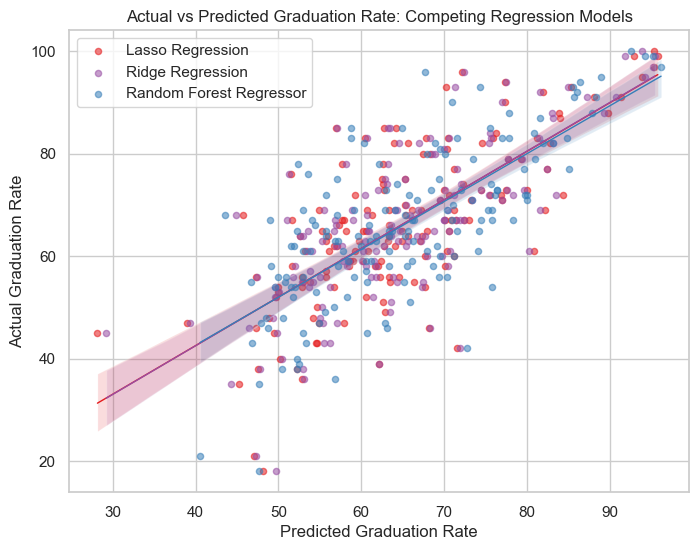

In [126]:
# Plot of the three model residuals

palette = sns.color_palette('Set1', 20)

plt.figure(figsize=(8,6)) 
sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data=lasso_y_residuals, 
            scatter_kws={"color":palette[0], "alpha":0.55, "s":20}, 
            line_kws={'color':palette[0], "linewidth": 1}, 
            label='Lasso Regression')

sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data=ridge_y_residuals,
            scatter_kws={"color":palette[12], "alpha":0.55, "s":20}, 
            line_kws={'color':palette[12], "linewidth": 1},
            label='Ridge Regression')   

sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data=rfr_y_residuals,
            scatter_kws={"color":palette[19], "alpha":0.55, "s":20}, 
            line_kws={'color':palette[19], "linewidth": 1}, 
            label='Random Forest Regressor')

plt.title("Actual vs Predicted Graduation Rate: Competing Regression Models")
plt.legend()

In [127]:
# Define function to get the regression metrics into a table

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

def evaluate_regression_model(model, X_train, y_train, X_test, y_test):
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Compute the metrics
    metrics = {
        'Train RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
        'Test RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        'Train R^2': r2_score(y_train, y_train_pred),
        'Test R^2': r2_score(y_test, y_test_pred),
        'Train MAPE': 100 * mean_absolute_percentage_error(y_train, y_train_pred),
        'Test MAPE': 100 * mean_absolute_percentage_error(y_test, y_test_pred)
    }
    
    return metrics

def evaluate_multiple_models(models, X_train, y_train, X_test, y_test):
    results = []
    for name, model in models.items():
        metrics = evaluate_regression_model(model, X_train, y_train, X_test, y_test)
        results.append({'Model': name, **metrics})
    
    metrics_df = pd.DataFrame(results)
    return metrics_df

models = {
    'Lasso': model_lasso,
    'Ridge': ridge, 
    'Random Forest': rfr_best
}
metrics_df = evaluate_multiple_models(models, X_train, y_train, X_test, y_test)
metrics_df

,Model,Train RMSE,Test RMSE,Train R^2,Test R^2,Train MAPE,Test MAPE
0,Lasso,13.178,10.536,0.439,0.528,18.497,14.067
1,Ridge,13.144,10.597,0.442,0.523,18.451,14.275
2,Random Forest,11.371,10.544,0.582,0.527,15.450,14.318


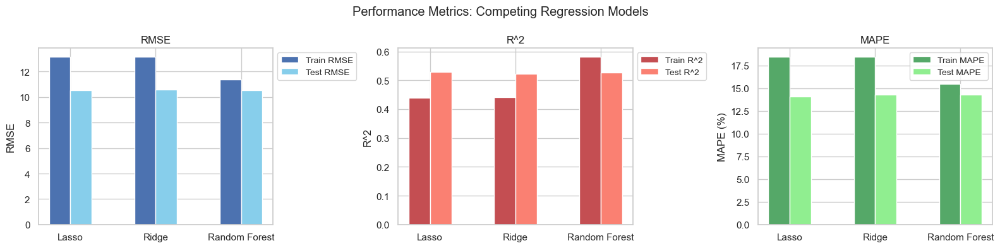

In [128]:
# Define function for bar plot of reg model performance metrics

def plot_regression_performance(models, X_train, y_train, X_test, y_test):
    model_names = list(models.keys())
    train_rmses = []
    test_rmses = []
    train_r_squareds = []
    test_r_squareds = []
    train_mapes = []
    test_mapes = []
    
    for model in models.values():
        metrics = evaluate_regression_model(model, X_train, y_train, X_test, y_test)
        train_rmses.append(metrics['Train RMSE'])
        test_rmses.append(metrics['Test RMSE'])
        train_r_squareds.append(metrics['Train R^2'])
        test_r_squareds.append(metrics['Test R^2'])
        train_mapes.append(metrics['Train MAPE'])
        test_mapes.append(metrics['Test MAPE'])
    
    index = np.arange(len(models))
    bar_width = 0.25 
    
    fig, axs = plt.subplots(1, 3, figsize=(16, 4), sharex=True)
    
    # RMSE Plot
    axs[0].bar(index - bar_width/2, train_rmses, bar_width, label='Train RMSE', color='b')
    axs[0].bar(index + bar_width/2, test_rmses, bar_width, label='Test RMSE', color='skyblue')
    axs[0].set_title('RMSE')
    axs[0].set_ylabel('RMSE')
    axs[0].legend()

    # R^2 Plot
    axs[1].bar(index - bar_width/2, train_r_squareds, bar_width, label='Train R^2', color='r')
    axs[1].bar(index + bar_width/2, test_r_squareds, bar_width, label='Test R^2', color='salmon')
    axs[1].set_title('R^2')
    axs[1].set_ylabel('R^2')
    axs[1].legend()

    # MAPE Plot
    axs[2].bar(index - bar_width/2, train_mapes, bar_width, label='Train MAPE', color='g')
    axs[2].bar(index + bar_width/2, test_mapes, bar_width, label='Test MAPE', color='lightgreen')
    axs[2].set_title('MAPE')
    axs[2].set_ylabel('MAPE (%)')
    axs[2].legend()

    for ax in axs:
        ax.set_xticks(index)
        ax.set_xticklabels(model_names)
        ax.legend(bbox_to_anchor=(1,1), fontsize='small')
    
    plt.suptitle("Performance Metrics: Competing Regression Models")
    plt.tight_layout()
    plt.show()

plot_regression_performance(models, X_train, y_train, X_test, y_test)